# Forecasting retail demand under stockouts

The
[FreshRetailNet-50K](https://huggingface.co/datasets/Dingdong-Inc/FreshRetailNet-50K)
dataset ([Yang et al., 2025](https://arxiv.org/abs/2505.16319)) contains
$50{,}000$ daily store-product demand series from fresh retail
operations: $90$ days per series, with hourly sales, hourly stockout
labels, and promotion, discount, and calendar covariates. The native
stockout labels make it a great public benchmark for a classic
operational problem: observed sales are a *censored* version of demand,
because a store cannot sell what is not on the shelf.

We model this with a **multiplicative availability factor**: expected
sales factor into a demand component and an availability component. A
forecasting model describes what demand would be with the product fully
in stock, and a multiplicative factor, a function of the day’s recorded
availability with parameters learned from the data, scales that demand
down when it was not. In this example the two components are:

- **Forecasting model**: a state space model with a trend, weekly
  seasonality, and promotion effects.
- **Availability factor**: a saturating function of the day’s stock
  availability.

The rationale is simple: when a product is out of stock, recorded sales
say little about demand, and without an explicit correction the
forecasting model would misread stockout days as low-demand days. The
factorization also pays off at prediction time: because the demand
component describes what would sell with the product fully in stock,
setting availability to one over the forecast horizon turns the sales
forecast into a *demand* forecast, which is the number a planner should
order against.

There is a catch, though, and it is the heart of this example: **days
whose stockout labels say the product was out of stock all day still
record positive sales about $15\%$ of the time**. A pure multiplicative
factor forces the mean to zero on those days and badly misfits them. The
likely reason is that the stockout labels are reconstructed from
imperfect inventory snapshots, so they carry noise, a common situation
in practice. The model developed in this notebook absorbs the
contradiction by learning a *floor* in the availability factor: even at
zero recorded availability, a small share of demand can still be sold.

We proceed in four steps. First, an exploratory analysis of the full
$50{,}000$-series dataset: we look closely at the stockout and
availability labels, quantify the contradiction above, and trace it to
label noise concentrated in hours that carry almost no demand, which
motivates both a *sales-weighted* availability feature and the *learned
floor* in the availability factor. Second, we fit a hierarchical state
space model to the top $1{,}000$ series with SVI and a custom `optax`
optimizer, wrapping the results in an ArviZ `DataTree`. Third, we
evaluate the forecasts with CRPS and central-interval coverage on a
simple train-test split against a seasonal-naive baseline. Fourth, we
re-issue the forecast with availability pinned to one over the horizon:
a counterfactual estimate of uncensored demand that is deliberately
*not* meant to track the observed (censored) sales, and is exactly what
a business should plan against, since nobody knows future availability
at prediction time. We close by inspecting what the model learned: the
fitted availability factor, the store hierarchy, and the promotion
contributions.

> **Scaling:**
> [Here](https://juanitorduz.github.io/fresh_retail_stockout/) you can
> find a modified version of this example where we train the same model
> on the whole dataset ($50K$ time series) on a GPU via
> [Modal](https://modal.com/). The end-to end notebook runs in
> approximately $10$ minutes on GPU 🚀!

## Prepare notebook

In [1]:
from collections.abc import Callable
from typing import cast

import arviz as az
import jax
import jax.numpy as jnp
import matplotlib.dates as mdates
import matplotlib.lines as mlines
import matplotlib.pyplot as plt
import numpy as np
import numpyro
import numpyro.distributions as dist
import optax
import polars as pl
import preliz as pz
import xarray as xr
from huggingface_hub import hf_hub_download
from huggingface_hub import logging as hf_logging
from jax import random
from jaxtyping import Float, Int
from matplotlib import ticker as mtick
from numpyro import handlers
from numpyro.infer import SVI, Predictive, Trace_ELBO
from numpyro.infer.autoguide import AutoNormal
from numpyro.infer.reparam import LocScaleReparam
from numpyro.optim import optax_to_numpyro
from sklearn.preprocessing import LabelEncoder

from numpyro_forecast import (
    Horizon,
    draw_posterior,
    eval_coverage,
    eval_crps,
    forecast,
    innovations,
    markov_series,
    predict,
    predict_in_sample,
    predictions_to_datatree,
    to_datatree,
)
from numpyro_forecast.features import periodic_repeat
from numpyro_forecast.metrics import crps_empirical
from numpyro_forecast.typing import Array, ForecastModel

az.style.use("arviz-darkgrid")
plt.rcParams["figure.figsize"] = [12, 7]
plt.rcParams["figure.dpi"] = 100
plt.rcParams["figure.facecolor"] = "white"

# Render polars tables without truncating string cells, and drop the shape and
# dtype headers, which are noise in a rendered document.
pl.Config.set_fmt_str_lengths(100)
pl.Config.set_tbl_hide_dataframe_shape(True)
pl.Config.set_tbl_hide_column_data_types(True)

# The Hub intermittently sends an unauthenticated-request warning header on
# responses, which huggingface_hub logs to stderr; the example needs no token,
# so keep the rendered document clean.
hf_logging.set_verbosity_error()

numpyro.set_host_device_count(n=4)

rng_key = random.PRNGKey(seed=42)

%load_ext autoreload
%autoreload 2
%load_ext jaxtyping
%jaxtyping.typechecker beartype.beartype
%config InlineBackend.figure_format = "retina"

/Users/juanitorduz/Documents/numpyro_forecast/.venv/lib/python3.14/site-packages/preliz/ppls/pymc_io.py:16: UserWarning: PyMC not installed. PyMC related functions will not work.
  warnings.warn("PyMC not installed. PyMC related functions will not work.")
/Users/juanitorduz/Documents/numpyro_forecast/.venv/lib/python3.14/site-packages/preliz/ppls/agnostic.py:34: UserWarning: PyMC not installed. PyMC related functions will not work.
  warnings.warn("PyMC not installed. PyMC related functions will not work.")

## Read data

We download the training split (a single parquet file, cached locally by
`huggingface_hub`) and scan it lazily with polars, so the full-dataset
aggregations below stream instead of materializing all $4.5$ million
rows.

In [2]:
parquet_path: str = hf_hub_download(
    repo_id="Dingdong-Inc/FreshRetailNet-50K",
    filename="data/train.parquet",
    repo_type="dataset",
)
data_lf: pl.LazyFrame = pl.scan_parquet(parquet_path)

data_lf.collect_schema()

Schema([('city_id', Int64),
        ('store_id', Int64),
        ('management_group_id', Int64),
        ('first_category_id', Int64),
        ('second_category_id', Int64),
        ('third_category_id', Int64),
        ('product_id', Int64),
        ('dt', String),
        ('sale_amount', Float64),
        ('hours_sale', List(Float64)),
        ('stock_hour6_22_cnt', Int32),
        ('hours_stock_status', List(Int64)),
        ('discount', Float64),
        ('holiday_flag', Int32),
        ('activity_flag', Int32),
        ('precpt', Float64),
        ('avg_temperature', Float64),
        ('avg_humidity', Float64),
        ('avg_wind_level', Float64)])

In [3]:
data_lf.select(
    pl.len().alias("rows"),
    pl.col("city_id").n_unique().alias("cities"),
    pl.col("store_id").n_unique().alias("stores"),
    pl.col("product_id").n_unique().alias("products"),
    pl.struct(["store_id", "product_id"]).n_unique().alias("series"),
    pl.col("dt").min().alias("start_date"),
    pl.col("dt").max().alias("end_date"),
).collect(engine="streaming")

Every one of the $50{,}000$ store-product series covers the same $90$
days. Three columns drive this notebook:

- `sale_amount` is the daily sales target, and `hours_sale` is its
  hourly decomposition (it sums to `sale_amount` up to float rounding).
- `hours_stock_status` is a $24$-vector of hourly stockout indicators
  ($1$ means out of stock in that hour).
- `stock_hour6_22_cnt` counts stockout hours within the $6{:}00$ to
  $22{:}00$ daytime window, so its maximum is $16$.

The next cell verifies these conventions directly instead of trusting
the documentation.

In [4]:
data_lf.select(
    (pl.col("hours_sale").list.sum() - pl.col("sale_amount")).abs().max().alias("max_abs_diff"),
    pl.col("hours_stock_status").list.len().max().alias("hours_per_day"),
    pl.col("stock_hour6_22_cnt").max().alias("max_daytime_stockout_hours"),
).collect(engine="streaming")

## Exploratory data analysis

The queries in this section are built from small named polars expression
functions, chained with `pipe` for the frame-level steps, so each query
reads top to bottom. The expressions defined along the way (stockout
hours, scaled sales, the sales-weighted availability) are reused all the
way into the modeling panel.

### How prevalent are stockouts?

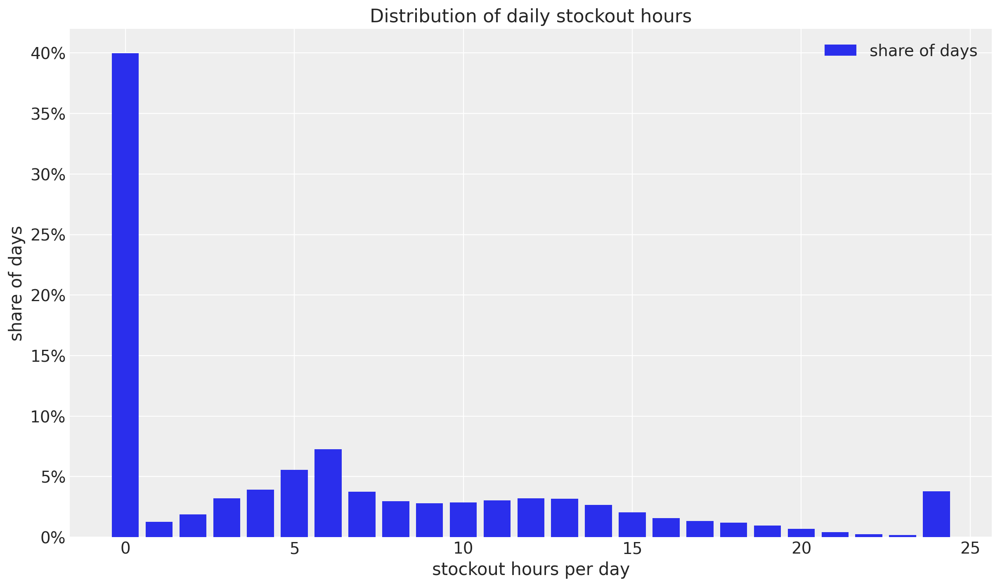

In [5]:
def stockout_hours() -> pl.Expr:
    """Count the hours of the day flagged out of stock."""
    return pl.col("hours_stock_status").list.sum()


stockout_hours_df = (
    data_lf.group_by(stockout_hours().alias("stockout_hours"))
    .len()
    .sort("stockout_hours")
    .with_columns((pl.col("len") / pl.col("len").sum()).alias("share_of_days"))
    .collect(engine="streaming")
)

fig, ax = plt.subplots()
ax.bar(
    stockout_hours_df["stockout_hours"],
    stockout_hours_df["share_of_days"],
    color="C0",
    label="share of days",
)
ax.legend(loc="upper right")
ax.yaxis.set_major_formatter(mtick.PercentFormatter(xmax=1, decimals=0))
ax.set(
    xlabel="stockout hours per day",
    ylabel="share of days",
    title="Distribution of daily stockout hours",
);

The distribution is strongly bimodal: $40\%$ of the days have no
stockout at all, most of the rest lose a handful of hours, and a visible
spike of about $3.8\%$ of the days is flagged out of stock for all $24$
hours.

### The contradiction: sales on fully out-of-stock days

If the labels were exact, a day flagged out of stock for every hour
could not sell anything. Let us check that under both stockout
definitions (all $24$ hours flagged, and all $16$ daytime hours
flagged).

In [6]:
max_daytime_hours = 16


def oos_all_day() -> pl.Expr:
    """Day flagged out of stock for all 24 hours."""
    return stockout_hours() == 24


def oos_daytime() -> pl.Expr:
    """Day flagged out of stock for all 16 daytime (6:00 to 22:00) hours."""
    return pl.col("stock_hour6_22_cnt") == max_daytime_hours


def scaled_sales() -> pl.Expr:
    """Daily sales scaled by the series' own mean, so 1 is an average day."""
    return pl.col("sale_amount") / pl.col("sale_amount").mean().over("store_id", "product_id")


def share_positive_sales_when(flag: pl.Expr) -> pl.Expr:
    """Share of days with positive sales among the days where ``flag`` holds."""
    return (pl.col("sale_amount") > 0).filter(flag).mean()


data_lf.select(
    oos_all_day().mean().alias("share_days_oos_all_day"),
    oos_daytime().mean().alias("share_days_oos_daytime"),
    share_positive_sales_when(oos_all_day()).alias("p_sales_oos_all_day"),
    share_positive_sales_when(oos_daytime()).alias("p_sales_oos_daytime"),
    scaled_sales()
    .filter(oos_all_day() & (pl.col("sale_amount") > 0))
    .mean()
    .alias("relative_sales_when_positive"),
).collect(engine="streaming")

About $15\%$ of the all-day stockout days (and $19\%$ of the daytime
ones) still record positive sales, and when they do the amount is not
negligible: about a quarter of the series’ average daily sales.
Plausible mechanisms are stockout labels reconstructed from inventory
snapshots, a sell-out followed by a restock within the same hour, or
back-room stock that never registered on the shelf system. Whatever the
cause, the labels are noisy, and a model that pins the mean at zero
whenever recorded availability is zero is misspecified.

### When do sales and stockouts happen within the day?

The hourly decomposition tells us how much each flagged hour actually
matters for daily demand.

share of sales in the 6:00 to 22:00 window: 95.2%
peak hourly stockout rate: 41.9% (hour 22)

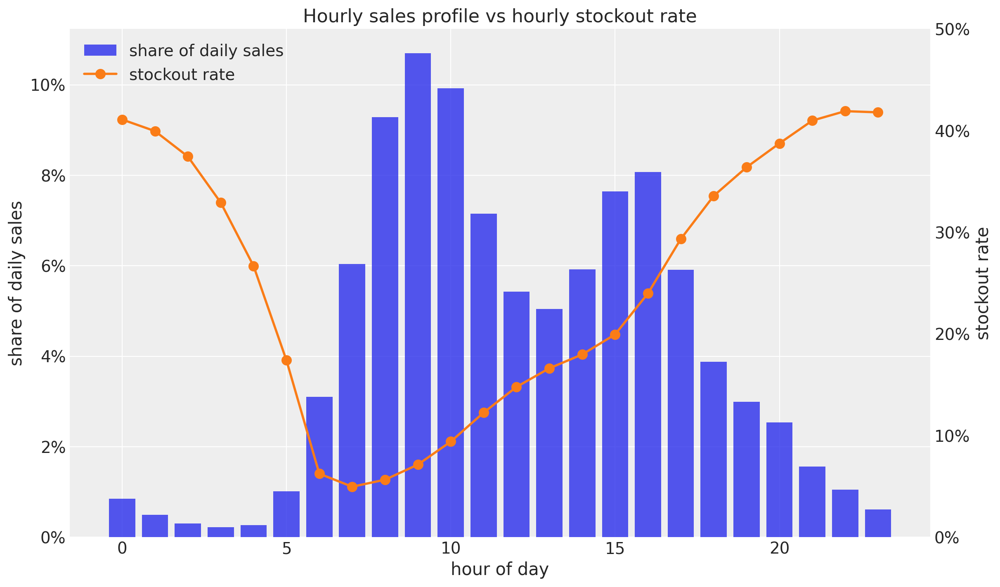

In [7]:
def total_sales_in_hour(hour: int) -> pl.Expr:
    """Total sales recorded in one hour of the day, over the full dataset."""
    return pl.col("hours_sale").list.get(hour).sum()


def stockout_rate_in_hour(hour: int) -> pl.Expr:
    """Share of days flagged out of stock in one hour of the day."""
    return pl.col("hours_stock_status").list.get(hour).mean()


hourly_row = (
    data_lf.select(
        *[total_sales_in_hour(h).alias(f"sales_{h}") for h in range(24)],
        *[stockout_rate_in_hour(h).alias(f"oos_{h}") for h in range(24)],
    )
    .collect(engine="streaming")
    .row(0)
)
sales_by_hour = np.asarray(hourly_row[:24], dtype=np.float64)
stockout_rate_by_hour = np.asarray(hourly_row[24:], dtype=np.float64)
hourly_weights = sales_by_hour / sales_by_hour.sum()

fig, ax = plt.subplots()
ax.bar(np.arange(24), hourly_weights, color="C0", alpha=0.8, label="share of daily sales")
ax_twin = ax.twinx()
ax_twin.plot(
    np.arange(24),
    stockout_rate_by_hour,
    color="C1",
    marker="o",
    markersize=8,
    linewidth=2,
    label="stockout rate",
)
ax_twin.grid(False)
ax_twin.set(ylabel="stockout rate", ylim=(0, 0.5))
handles, bar_labels = ax.get_legend_handles_labels()
handles_twin, labels_twin = ax_twin.get_legend_handles_labels()
ax.legend(handles + handles_twin, bar_labels + labels_twin, loc="upper left")
ax.yaxis.set_major_formatter(mtick.PercentFormatter(xmax=1, decimals=0))
ax_twin.yaxis.set_major_formatter(mtick.PercentFormatter(xmax=1, decimals=0))
ax.set(
    xlabel="hour of day",
    ylabel="share of daily sales",
    title="Hourly sales profile vs hourly stockout rate",
)
print(f"share of sales in the 6:00 to 22:00 window: {hourly_weights[6:22].sum():.1%}")
print(
    f"peak hourly stockout rate: {stockout_rate_by_hour.max():.1%} "
    f"(hour {int(stockout_rate_by_hour.argmax())})"
)

The two curves are almost mirror images: sales concentrate between
$7{:}00$ and $20{:}00$ ($95\%$ of all sales fall in the $6{:}00$ to
$22{:}00$ window), while the stockout rate peaks at $42\%$ late at
night, exactly when nobody is buying. A raw $24$-hour stockout count
therefore heavily over-penalizes availability. We can also measure the
label noise directly: how much of the total sales volume is recorded in
hours that are flagged out of stock?

In [8]:
def sales_in_flagged_hours() -> pl.Expr:
    """Sales volume recorded in the hours whose own stockout flag is set."""
    return pl.sum_horizontal(
        [
            (pl.col("hours_sale").list.get(h) * pl.col("hours_stock_status").list.get(h))
            for h in range(24)
        ]
    )


data_lf.select(
    (sales_in_flagged_hours().sum() / pl.col("hours_sale").list.sum().sum()).alias(
        "share_of_sales_in_flagged_stockout_hours"
    )
).collect(engine="streaming")

$2.5\%$ of *all* sales happen in hours the labels declare out of stock.
This is direct, hour-level evidence that the stockout signal has noise
that no availability feature can remove, and it is why the model below
learns a floor instead of trusting availability zero to mean demand
zero.

### A sales-weighted availability feature

Instead of counting stockout hours uniformly, we weight each hour by its
share of global sales, so that losing a night hour costs almost nothing
and losing the morning peak costs a lot:

$$\begin{align*}
a_{t,s} &= \sum_{h=0}^{23} w_h \left(1 - \text{stockout}_{t,s,h}\right), \\
w_h &= \frac{\text{total sales in hour } h}{\text{total sales}}.
\end{align*}$$

One note on hygiene: the weights $w_h$ are a global hour-of-day profile
computed over the full dataset, test window included, whereas a deployed
system would compute them on history only. We keep the dataset-wide
profile for simplicity; the effect of $14$ extra days on a fixed
$24$-number profile is negligible, and the availability feature itself
is treated as a known future input in the retrospective evaluation set
up below anyway.

In [9]:
def sales_weighted_availability(weights: Float[np.ndarray, " hours"]) -> pl.Expr:
    """In-stock share of the day, weighting each hour by its share of global sales."""
    return pl.sum_horizontal(
        [(1 - pl.col("hours_stock_status").list.get(h)) * float(weights[h]) for h in range(24)]
    ).alias("availability")


def zero_availability_summary(
    lf: pl.LazyFrame, zero_flag: pl.Expr, definition: str
) -> pl.LazyFrame:
    """Summarize the zero-availability days implied by one stockout definition."""
    return lf.select(
        pl.lit(definition).alias("definition"),
        zero_flag.mean().alias("share_days_zero_availability"),
        share_positive_sales_when(zero_flag).alias("p_positive_sales_given_zero"),
    )


availability_expr: pl.Expr = sales_weighted_availability(hourly_weights)

pl.concat(
    [
        data_lf.pipe(zero_availability_summary, oos_daytime(), "daytime hours all flagged"),
        data_lf.pipe(zero_availability_summary, oos_all_day(), "all 24 hours flagged"),
        data_lf.pipe(
            zero_availability_summary, availability_expr == 0, "sales-weighted availability = 0"
        ),
    ]
).collect(engine="streaming")

Two remarks on this table. First, because every hour carries a positive
share of global sales, the weighted availability is exactly zero only
when all $24$ hours are flagged: its zero set coincides with the all-day
definition by construction, and it inherits that definition’s lower
$15\%$ contradiction rate. The daytime definition’s hard zero is both
noisier ($19\%$) and cruder, since it also zeroes out days that were
merely stocked overnight; under the weighted feature those days keep a
tiny positive $a_{t,s}$ instead. Second, the feature’s real contribution
lies between the extremes: it grades partial days by how much *selling
time* they lose, so a lost night hour costs almost nothing and a lost
morning-peak hour costs a lot. The $15\%$ that remains at exact zero is
irreducible label noise, and the model handles it with a learned floor
rather than a data transformation.

### The empirical demand-availability curve

How do sales respond to partial availability? We scale each series by
its own mean (so different volumes are comparable) and bin the scaled
sales by weighted availability.

empirical floor at zero availability: 0.037

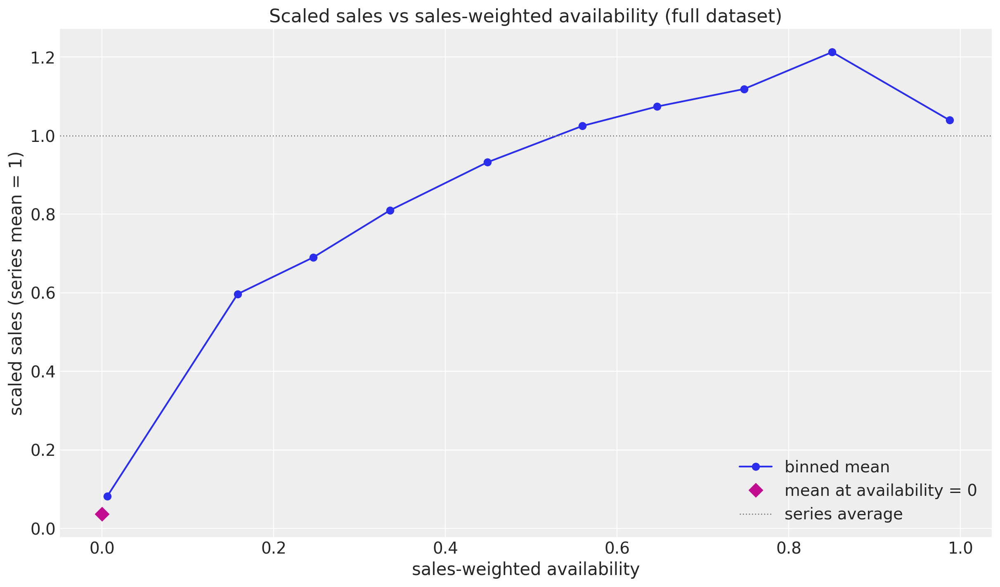

In [10]:
def availability_bin() -> pl.Expr:
    """Decile bin (0 to 9) of the sales-weighted availability."""
    return (pl.col("availability") * 10).floor().clip(0, 9).alias("availability_bin")


def mean_scaled_sales_by_availability_bin(lf: pl.LazyFrame) -> pl.LazyFrame:
    """Bin the days by availability and average the scaled sales within each bin."""
    return (
        lf.group_by(availability_bin())
        .agg(
            pl.col("availability").mean().alias("mean_availability"),
            pl.col("scaled_sales").mean().alias("mean_scaled_sales"),
            pl.len().alias("days"),
        )
        .sort("availability_bin")
    )


def mean_scaled_sales_at_zero_availability(lf: pl.LazyFrame) -> pl.LazyFrame:
    """Average the scaled sales over the days with zero sales-weighted availability."""
    return lf.filter(pl.col("availability") == 0).select(
        pl.col("scaled_sales").mean().alias("mean_scaled_sales"),
        pl.len().alias("days"),
    )


availability_sales_lf = data_lf.with_columns(
    availability_expr, scaled_sales().alias("scaled_sales")
)
factor_curve_df = availability_sales_lf.pipe(mean_scaled_sales_by_availability_bin).collect(
    engine="streaming"
)
empirical_floor_df = availability_sales_lf.pipe(mean_scaled_sales_at_zero_availability).collect(
    engine="streaming"
)
empirical_floor = float(empirical_floor_df["mean_scaled_sales"][0])

fig, ax = plt.subplots()
ax.plot(
    factor_curve_df["mean_availability"],
    factor_curve_df["mean_scaled_sales"],
    "o-",
    color="C0",
    label="binned mean",
)
ax.plot(0.0, empirical_floor, "D", color="C3", markersize=8, label="mean at availability = 0")
ax.axhline(1.0, color="gray", linestyle=":", linewidth=1, label="series average")
ax.legend(loc="lower right")
ax.set(
    xlabel="sales-weighted availability",
    ylabel="scaled sales (series mean = 1)",
    title="Scaled sales vs sales-weighted availability (full dataset)",
)
print(f"empirical floor at zero availability: {empirical_floor:.3f}")

The curve is saturating, exactly the shape a multiplicative factor
should have: steep gains at low availability, flattening out near full
availability. Two details matter for the model. First, the value at zero
availability is positive (about $0.04$), which is the empirical floor
the factor must reproduce. Second, the bins just below full availability
sit slightly *above* the fully-available bin. That is endogeneity, not
magic: stockouts happen disproportionately on high-demand days (a
sell-out is itself evidence of demand), so a naive read of this curve
overstates what availability alone does. The model mitigates this by
attributing day-to-day variation to the trend, weekly seasonality, and
promotion covariates jointly with the factor.

### Promotion and calendar covariates

We encode the discount as `discount_magnitude = 1 - discount`, so zero
means no discount and larger values mean deeper discounts (a positive
coefficient then reads “more discount, more sales”).

In [11]:
def raw_discount_magnitude() -> pl.Expr:
    """Depth of the discount read literally from the raw column: 1 - discount."""
    return 1 - pl.col("discount")


def mean_scaled_sales_when(flag: str, active: bool) -> pl.Expr:
    """Mean scaled sales over the days where a 0/1 flag column is (in)active."""
    prefix = "scaled" if active else "scaled_no"
    name = flag.removesuffix("_flag")
    return scaled_sales().filter(pl.col(flag) == int(active)).mean().alias(f"{prefix}_{name}")


data_lf.select(
    raw_discount_magnitude().mean().alias("mean_discount_magnitude"),
    (raw_discount_magnitude() > 0).mean().alias("share_days_discounted"),
    (pl.col("discount") == 0).mean().alias("share_days_discount_zero"),
    pl.col("activity_flag").mean().alias("share_days_activity"),
    pl.col("holiday_flag").mean().alias("share_days_holiday"),
    mean_scaled_sales_when("activity_flag", active=True),
    mean_scaled_sales_when("activity_flag", active=False),
    mean_scaled_sales_when("holiday_flag", active=True),
    mean_scaled_sales_when("holiday_flag", active=False),
).unpivot().collect(engine="streaming")

Discounts are common (about half of all days, with a mean magnitude near
$9\%$), promotion activity lifts scaled sales by roughly $20\%$ on
average, and holidays by roughly a quarter. All three are worth
including as regression covariates, with effects pooled hierarchically
by store. One anomaly to keep in mind: a small share of days ($0.4\%$
dataset-wide) records `discount = 0`, which read literally would be a
$100\%$ discount and is far more plausibly an unpriced placeholder; it
looks negligible here, but we will meet it again in the modeling panel,
where it turns out to be concentrated in exactly the series we model.

## Build the modeling panel

We model the top $1{,}000$ series by total sales over the training
window: ranking on the full window would let test-period spikes decide
which series get modeled and scored, the same class of leak the scaling
discussion below is careful to keep out of the fold. The last $14$ days
are held out as a test set; the model trains on the first $76$ days and
receives the *actual* covariates (availability, discount, promotion,
holiday, launch indicator) over the forecast window, which is the
standard retrospective evaluation setup.

Getting from the long dataframe to model-ready arrays is worth doing
carefully, because every shape convention we set here is relied on by
the model and by the ArviZ export. We proceed in five steps: pivot the
long panel into dense `(time, series)` arrays, scale each series by its
own training mean, build the integer store index that drives the
hierarchical pooling, add the panel-wide launch indicator, and stack all
exogenous inputs into a single tensor with named axes.

One data decision happens right in the panel build: the placeholder
`discount = 0` days flagged in the EDA are encoded as *no discount* (and
the handful of `discount > 1` artifacts are clipped). The feature itself
stays in the model; the encoding fix is what makes its coefficient read
as a genuine discount effect rather than a data-gap indicator, and the
promotion plot further below shows why that matters for this panel.

In [12]:
n_series_panel = 1_000
t_train = 76
horizon = 14


def top_series_by_total_sales(lf: pl.LazyFrame, n: int) -> pl.LazyFrame:
    """Rank the series by total sales over the window and keep the top ``n``."""
    return (
        lf.group_by("store_id", "product_id")
        .agg(pl.col("sale_amount").sum().alias("total_sales"))
        .sort("total_sales", descending=True)
        .head(n)
    )


def keep_top_series(lf: pl.LazyFrame, top_series: pl.DataFrame) -> pl.LazyFrame:
    """Keep only the rows belonging to the selected store-product series."""
    return lf.join(
        top_series.lazy().select("store_id", "product_id"), on=["store_id", "product_id"]
    )


def series_unique_id() -> pl.Expr:
    """Store-product identifier ``store::product`` naming each series."""
    return pl.concat_str(["store_id", "product_id"], separator="::").alias("unique_id")


def cleaned_discount_magnitude() -> pl.Expr:
    """Discount depth with the placeholder days encoded as no discount.

    ``discount == 0`` records are unpriced placeholders (not free giveaways), so
    they map to zero magnitude; values above 1 are clipped artifacts.
    """
    return (
        pl.when(pl.col("discount") > 0)
        .then(raw_discount_magnitude().clip(0.0, 1.0))
        .otherwise(0.0)
        .alias("discount_magnitude")
    )


# Rank on the training window only: the modeled panel must be chosen before
# observing the test window, the same fold discipline the per-series scale
# gets in the scaling section below.
in_train_window = pl.col("dt").str.to_date() < (
    pl.col("dt").str.to_date().min() + pl.duration(days=t_train)
)
top_series_df = (
    data_lf.filter(in_train_window)
    .pipe(top_series_by_total_sales, n_series_panel)
    .collect(engine="streaming")
)

panel_df = (
    data_lf.pipe(keep_top_series, top_series_df)
    .with_columns(
        pl.col("dt").str.to_date(),
        series_unique_id(),
        availability_expr,
        cleaned_discount_magnitude(),
    )
    .select(
        "dt",
        "unique_id",
        "store_id",
        "sale_amount",
        "availability",
        "discount_magnitude",
        pl.col("activity_flag").cast(pl.Float64),
        pl.col("holiday_flag").cast(pl.Float64),
    )
    .collect(engine="streaming")
    .sort("unique_id", "dt")
)

series_ids: list[str] = panel_df["unique_id"].unique().sort().to_list()
n_series = len(series_ids)
dates_series = panel_df["dt"].unique().sort()
dates = dates_series.to_numpy()

panel_df.head()

### From long panel to a named dataset

The package convention places time at axis $-2$ and the observation
(series) axis last, so the data panel is a dense `(time, n_series)`
matrix. `make_pivot` builds one such matrix per column, always selecting
the columns in `series_ids` order: that single sorted list defines the
series axis *everywhere* (data, covariates, store index, ArviZ
coordinates), so column $s$ refers to the same store-product pair in
every array that follows. The function also validates the result, one
row per date, one column per series, and no missing entries, so a silent
join or pivot problem fails loudly here instead of corrupting the fit
later.

The pivots themselves go straight into an `xarray.Dataset` with named
`time` and `series` coordinates, and that dataset is the source of truth
for everything downstream: selections read by label
(`panel_ds["sale_amount"].sel(series="22::267")`) instead of positional
index bookkeeping, reductions name their axis (`.mean("time")`), and the
plain `jax.numpy` arrays the model consumes are extracted from it at the
model boundary.

In [13]:
def make_pivot(value: str) -> Float[np.ndarray, " duration n_series"]:
    """Build the dense (date x series) matrix of one panel column.

    Columns follow ``series_ids`` order so every pivot shares the same series axis.
    """
    pivot_df = panel_df.pivot(index="dt", on="unique_id", values=value).sort("dt")
    matrix = pivot_df.select(series_ids).to_numpy().astype(np.float64)
    if matrix.shape != (len(dates), n_series) or np.isnan(matrix).any():
        msg = f"Unexpected pivot for {value!r}: shape {matrix.shape}"
        raise ValueError(msg)
    return matrix


panel_ds: xr.Dataset = xr.Dataset(
    {
        name: (("time", "series"), make_pivot(name))
        for name in [
            "sale_amount",
            "availability",
            "discount_magnitude",
            "activity_flag",
            "holiday_flag",
        ]
    },
    coords={"time": dates, "series": series_ids},
)

panel_ds

<xarray.Dataset> Size: 4MB
Dimensions: (time: 90, series: 1000)
Coordinates:
 * time (time) datetime64[s] 720B 2024-03-28 ... 2024-06-25
 * series (series) <U8 32kB '0::117' '0::691' ... '99::589' '9::4'
Data variables:
 sale_amount (time, series) float64 720kB 0.3 3.5 5.1 ... 13.7 1.7
 availability (time, series) float64 720kB 0.0 0.8421 ... 0.899 0.6361
 discount_magnitude (time, series) float64 720kB 0.0 0.0 0.0 ... 0.0 0.059
 activity_flag (time, series) float64 720kB 0.0 0.0 0.0 ... 0.0 0.0 0.0
 holiday_flag (time, series) float64 720kB 0.0 0.0 0.0 ... 0.0 0.0 0.0 xarray.Dataset Dimensions: time : 90 series : 1000 Coordinates: (2) time (time) datetime64[s] 2024-03-28 ... 2024-06-25 array(['2024-03-28T00:00:00', '2024-03-29T00:00:00', '2024-03-30T00:00:00',
 '2024-03-31T00:00:00', '2024-04-01T00:00:00', '2024-04-02T00:00:00',
 '2024-04-03T00:00:00', '2024-04-04T00:00:00', '2024-04-05T00:00:00',
 '2024-04-06T00:00:00', '2024-04-07T00:00:00', '2024-04-08T00:00:00',
 '2024-04-09T00:00:00', '2024-04-10T00:00:00', '2024-04-11T00:00:00',
 '2024-04-12T00:00:00', '2024-04-13T00:00:00', '2024-04-14T00:00:00',
 '2024-04-15T00:00:00', '2024-04-16T00:00:00', '2024-04-17T00:00:00',
 '2024-04-18T00:00:00', '2024-04-19T00:00:00', '2024-04-20T00:00:00',
 '2024-04-21T00:00:00', '2024-04-22T00:00:00', '2024-04-23T00:00:00',
 '2024-04-24T00:00:00', '2024-04-25T00:00:00', '2024-04-26T00:00:00',
 '2024-04-27T00:00:00', '2024-04-28T00:00:00', '2024-04-29T00:00:00',
 '2024-04-30T00:00:00', '2024-05-01T00:00:00', '2024-05-02T00:00:00',
 '2024-05-03T00:00:00', '2024-05-04T00:00:00', '2024-05-05T00:00:00',
 '2024-05-06T00:00:00', '2024-05-07T00:00:00', '2024-05-08T00:00:00',
 '2024-05-09T00:00:00', '2024-05-10T00:00:00', '2024-05-11T00:00:00',
 '2024-05-12T00:00:00', '2024-05-13T00:00:00', '2024-05-14T00:00:00',
 '2024-05-15T00:00:00', '2024-05-16T00:00:00', '2024-05-17T00:00:00',
 '2024-05-18T00:00:00', '2024-05-19T00:00:00', '2024-05-20T00:00:00',
 '2024-05-21T00:00:00', '2024-05-22T00:00:00', '2024-05-23T00:00:00',
 '2024-05-24T00:00:00', '2024-05-25T00:00:00', '2024-05-26T00:00:00',
 '2024-05-27T00:00:00', '2024-05-28T00:00:00', '2024-05-29T00:00:00',
 '2024-05-30T00:00:00', '2024-05-31T00:00:00', '2024-06-01T00:00:00',
 '2024-06-02T00:00:00', '2024-06-03T00:00:00', '2024-06-04T00:00:00',
 '2024-06-05T00:00:00', '2024-06-06T00:00:00', '2024-06-07T00:00:00',
 '2024-06-08T00:00:00', '2024-06-09T00:00:00', '2024-06-10T00:00:00',
 '2024-06-11T00:00:00', '2024-06-12T00:00:00', '2024-06-13T00:00:00',
 '2024-06-14T00:00:00', '2024-06-15T00:00:00', '2024-06-16T00:00:00',
 '2024-06-17T00:00:00', '2024-06-18T00:00:00', '2024-06-19T00:00:00',
 '2024-06-20T00:00:00', '2024-06-21T00:00:00', '2024-06-22T00:00:00',
 '2024-06-23T00:00:00', '2024-06-24T00:00:00', '2024-06-25T00:00:00'],
 dtype='datetime64[s]') series (series) <U8 '0::117' '0::691' ... '9::4' array(['0::117', '0::691', '0::70', ..., '98::267', '99::589', '9::4'],
 shape=(1000,), dtype='<U8') Data variables: (5) sale_amount (time, series) float64 0.3 3.5 5.1 3.6 ... 32.7 13.7 1.7 array([[ 0.3, 3.5, 5.1, ..., 3. , 5.8, 1.5],
 [ 5. , 4.9, 2.7, ..., 3. , 5.9, 2.4],
 [ 6.6, 6.6, 6.6, ..., 3. , 9.2, 6.8],
 ...,
 [ 6.2, 6.1, 5.1, ..., 33.2, 15. , 4.2],
 [ 4.8, 6.4, 5. , ..., 24.1, 11.2, 2. ],
 [ 5.1, 6.2, 5.4, ..., 32.7, 13.7, 1.7]], shape=(90, 1000)) availability (time, series) float64 0.0 0.8421 0.9677 ... 0.899 0.6361 array([[0. , 0.84214031, 0.96773072, ..., 0.30402569, 0.72536543,
 0.30627405],
 [0.96853881, 0.95190416, 0.96853881, ..., 0.18424695, 0.58969883,
 0.40329786],
 [1. , 0.96853881, 1. , ..., 0.0914353 , 0.56669943,
 0.47482856],
 ...,
 [0.8736015 , 0.68842766, 0.55782077, ..., 0.91093046, 0.85230857,
 1. ],
 [0.98133034, 0.98357871, 0.92597036, ..., 0.79323237, 0.89900624,
 0.73382722],
 [1. , 1. , 0.97870707, ..., 0.97870707, 0.89900624,
 0.6360862 ]], shape=(90, 1000)) discount_magnitude (time, series) float64 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.059 array([[0. , 0. , 0. , ..., 0. , 0. , 0.1

### Per-series scaling

The panel mixes products that sell a handful of units per day with
products that sell dozens. A single set of priors cannot cover both on
the raw scale: an initial-level prior like $\text{Normal}(1, 0.5)$ would
be far too tight for one series and far too wide for another. Dividing
each series by its own mean daily sales puts every series on a common
unit scale, where $1$ means “an average day for this product”, and one
prior vocabulary works across the whole panel ($\text{Normal}(1, 0.5)$
is then exactly the prior the model places on the scaled initial level).
Two details matter:

- The scale is computed on the **training window only**. Computing it on
  the full series would leak the held-out level into the model input;
  the effect is mild on this dataset but catastrophic whenever the test
  window carries a trend.
- The scale is also the inverse map for evaluation: the model’s draws
  live on the scaled axis, and we multiply them by `scale` to score and
  plot in original sale units.

In [14]:
scale: xr.DataArray = panel_ds["sale_amount"].isel(time=slice(None, t_train)).mean("time")
y_scaled: xr.DataArray = panel_ds["sale_amount"] / scale
y_train: Float[Array, " t_train n_series"] = jnp.asarray(
    y_scaled.isel(time=slice(None, t_train)).to_numpy(), dtype=jnp.float32
)
y_train_original: Float[Array, " t_train n_series"] = jnp.asarray(
    panel_ds["sale_amount"].isel(time=slice(None, t_train)).to_numpy(), dtype=jnp.float32
)
y_test_original: Float[Array, " horizon n_series"] = jnp.asarray(
    panel_ds["sale_amount"].isel(time=slice(t_train, None)).to_numpy(), dtype=jnp.float32
)
scale_jax: Float[Array, " n_series"] = jnp.asarray(scale.to_numpy(), dtype=jnp.float32)

print(
    f"sale units per scaled unit: min {float(scale.min()):.2f} | "
    f"median {float(scale.median()):.2f} | max {float(scale.max()):.2f}"
)

sale units per scaled unit: min 3.96 | median 4.95 | max 18.10

### The store index `series_to_store`

The covariate effects $\beta_{c,s}$ are pooled by store: series from the
same store share a store-level location and scale. To express that
inside the model we need a lookup from the series axis to the store
axis, and that is exactly what `series_to_store` is: an integer vector
with one entry per series, `series_to_store[s] = m(s)`, aligned with the
same sorted `series_ids` order as every pivot (both come from sorting by
`unique_id`). We build it with scikit-learn’s `LabelEncoder`, which
consumes the polars column directly: `fit_transform` maps each store id
to its position among the sorted unique ids, and the fitted `classes_`
are exactly those sorted ids, so the same encoder yields both the
integer index the model gathers with and the `store` coordinate labels
the ArviZ export uses below. Inside the model, the advanced indexing
`b_loc_store[:, series_to_store]` gathers the `(n_cov, n_stores)`
store-level parameters into an `(n_cov, n_series)` array of per-series
prior locations, a vectorized dictionary lookup. The jaxtyping
annotation records the contract in the code: one integer per series.

The printout below carries a caveat worth keeping in mind: the panel
spreads its $1{,}000$ series over $525$ stores with a median of *one*
series per store. For a singleton store the store-level location is
informed by a single series, so the hierarchy there acts as
regularization toward the global hyperpriors rather than as cross-series
pooling; the genuine pooling happens in the multi-series stores (up to
eight series here). We revisit this when inspecting the fitted
hierarchy.

In [15]:
series_store_df = panel_df.select("unique_id", "store_id").unique().sort("unique_id")
store_encoder = LabelEncoder()
series_to_store: Int[Array, " n_series"] = jnp.asarray(
    store_encoder.fit_transform(series_store_df["store_id"]), dtype=jnp.int32
)
store_ids: list[int] = store_encoder.classes_.tolist()
n_stores = len(store_ids)
# The store id of each series as a named lookup table, for label-based gathers on
# the store dimension of the posterior (used in the hierarchy plot below).
series_store_da = xr.DataArray(
    series_store_df["store_id"].to_numpy(), dims=["series"], coords={"series": series_ids}
)

series_per_store = np.bincount(np.asarray(series_to_store), minlength=n_stores)
print(f"panel: {n_series} series map to {n_stores} stores")
print(
    f"series per store: min {series_per_store.min()} | "
    f"median {np.median(series_per_store):.0f} | max {series_per_store.max()}"
)
print(f"train: {t_train} days | test: {horizon} days")

panel: 1000 series map to 525 stores
series per store: min 1 | median 1 | max 8
train: 76 days | test: 14 days

### A launch indicator

The sales plots below share a striking pattern: most series jump to a
new level in late April, when this panel’s flagship product ramps up
across the assortment. That jump is a one-off structural event, not
demand dynamics, so we give the model an explicit launch indicator:
without a dedicated regressor for the step, any feature that happens to
flip around the launch can absorb it and come out with a nonsense
coefficient, putting the promotion effects in a tug-of-war with the
level. Alternatives that do not work here: relying on the cleaned
discount encoding alone (it shrinks the launch-aligned placeholder step,
but a shrunken step is still a step a coefficient can latch onto), and
per-series change-point detection (a thousand extra change points for an
event the data show is panel-wide and sharply dated).

We therefore fix one shared launch date, $2024$-$04$-$27$: the
panel-mean daily sales step up by more than $60\%$ day over day on
exactly that date, the largest jump in the window, and $39\%$ of the
series place their largest week-over-week jump between $2024$-$04$-$27$
and $2024$-$05$-$01$ (the per-series jump dates scatter a few days into
that cluster, so the panel-level step, not the per-series modal date,
pins down the event’s first day; the printout below has the numbers).
The indicator is $0$ before the launch date and $1$ from that day
onward, so over the forecast window it is constantly $1$: a known future
covariate.

modal largest-weekly-jump date: 2024-04-30
share of series with their largest weekly jump on 2024-04-27: 0.12
share with it between 2024-04-27 and 2024-05-01: 0.39
panel-mean sales step on 2024-04-27: 1.62x day over day

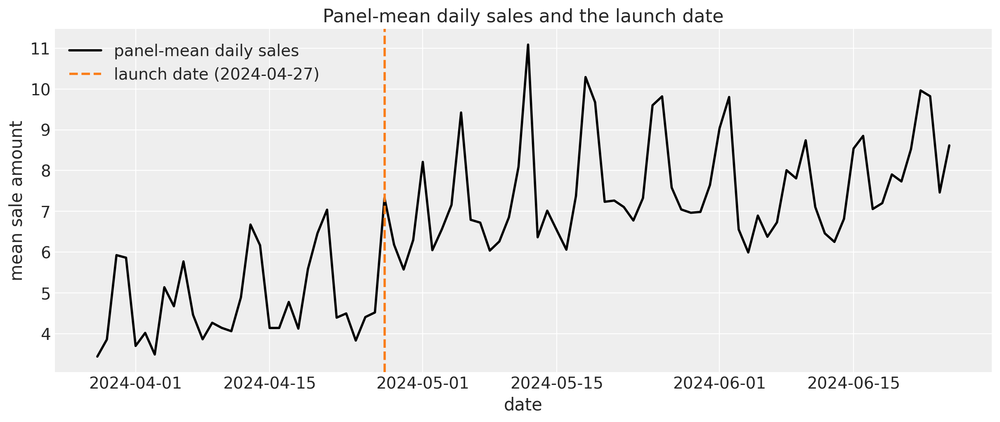

In [16]:
window = 7
# rolling labels each window by its last day, so the difference at day t compares
# the week ending at t with the week ending at t - 7; shifting the argmax back by
# window - 1 days labels each series' largest jump by the later week's first day.
rolling_mean = panel_ds["sale_amount"].isel(time=slice(None, t_train)).rolling(time=window).mean()
weekly_jump = rolling_mean - rolling_mean.shift(time=window)
jump_date = weekly_jump.idxmax("time") - np.timedelta64(window - 1, "D")

ramp_date = np.datetime64("2024-04-27")
ramp_x = float(mdates.date2num(ramp_date))
panel_ds["post_ramp"] = (
    (panel_ds["time"] >= ramp_date).astype(np.float64).broadcast_like(panel_ds["sale_amount"])
)

panel_mean_sales = panel_ds["sale_amount"].mean("series")

fig, ax = plt.subplots(figsize=(12, 5))
ax.plot(dates, panel_mean_sales, color="black", linewidth=2, label="panel-mean daily sales")
ax.axvline(ramp_x, color="C1", linestyle="--", linewidth=2, label="launch date (2024-04-27)")
ax.legend(loc="upper left")
ax.set(
    xlabel="date", ylabel="mean sale amount", title="Panel-mean daily sales and the launch date"
)
modal_dates, modal_counts = np.unique(jump_date.to_numpy(), return_counts=True)
share_modal = float((jump_date == ramp_date).mean())
share_cluster = float(
    ((jump_date >= ramp_date) & (jump_date <= np.datetime64("2024-05-01"))).mean()
)
step_ratio = float(
    panel_mean_sales.sel(time=ramp_date)
    / panel_mean_sales.sel(time=ramp_date - np.timedelta64(1, "D"))
)
print(
    f"modal largest-weekly-jump date: {modal_dates[modal_counts.argmax()].astype('datetime64[D]')}"
)
print(f"share of series with their largest weekly jump on 2024-04-27: {share_modal:.2f}")
print(f"share with it between 2024-04-27 and 2024-05-01: {share_cluster:.2f}")
print(f"panel-mean sales step on 2024-04-27: {step_ratio:.2f}x day over day")

### The model inputs tensor

The model consumes five exogenous inputs per series and day:
availability, the three promotion features, and the launch indicator.
Rather than flattening them into a wide 2-D matrix (packing and
unpacking by hand is exactly the kind of index bookkeeping that fails
silently), we stack the five panel variables into a single 3-D
`DataArray` with `to_dataarray`, whose leading `input` axis carries the
variable names as coordinate labels. The `jax.numpy` tensor the model
consumes is extracted at the boundary and keeps the same layout, with
the stack order also named in the jaxtyping hint,
`availability_discount_activity_holiday_ramp`, so it stays readable in
every signature that touches the tensor. This layout is fully compatible
with the package’s shape convention, which only requires time at axis
$-2$ with batch axes to the left. The train-forecast split stays a pure
time slice, and the forecast horizon is still derived from shapes alone:
training sees `covariates[:, :t_train, :]`, forecasting the full tensor.
The model unpacks the inputs by plain indexing instead of a reshape.
`to_datatree` stores covariates in `constant_data` as
`(time, covariate_dim)` by default, but accepts this tensor as-is
through its `covariate_dims` argument, which we use in the export
section below.

In [17]:
covariate_names = ["discount_magnitude", "activity_flag", "holiday_flag", "post_ramp"]
n_covariates = len(covariate_names)
input_names = ["availability", *covariate_names]

covariates_da: xr.DataArray = panel_ds[input_names].to_dataarray(dim="input")
covariates: Float[Array, " availability_discount_activity_holiday_ramp duration n_series"] = (
    jnp.asarray(covariates_da.transpose("input", "time", "series").to_numpy(), dtype=jnp.float32)
)
covariates_train: Float[Array, " availability_discount_activity_holiday_ramp t_train n_series"] = (
    covariates[:, :t_train, :]
)

print(f"model inputs: {covariates.shape} | train: {covariates_train.shape}")

model inputs: (5, 90, 1000) | train: (5, 76, 1000)

Before modeling, let us look at a few of the series we are about to fit:
the three largest by volume and the three with the most
zero-availability days.

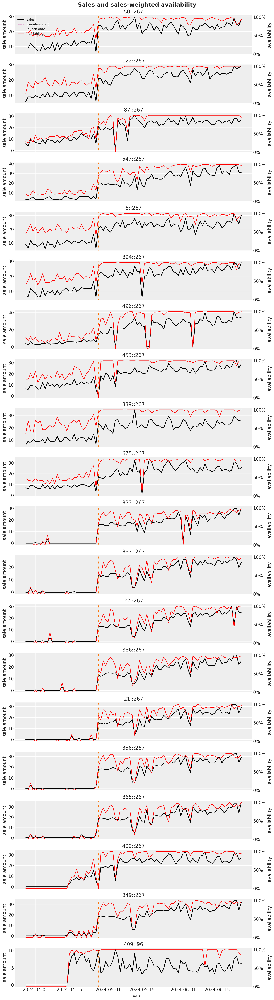

In [18]:
series_to_plot = 10
n_focus = 3


def top_series(ranking: xr.DataArray, n: int) -> list[str]:
    """Labels of the ``n`` series with the largest value of a per-series ranking."""
    return ranking["series"].to_numpy()[np.argsort(-ranking.to_numpy())[:n]].tolist()


total_sales_per_series = panel_ds["sale_amount"].sum("time")
zero_availability_days = (panel_ds["availability"] == 0.0).sum("time")
top_volume_labels = top_series(total_sales_per_series, series_to_plot)
top_stockout_labels = top_series(zero_availability_days, series_to_plot)
plot_labels = list(dict.fromkeys([*top_volume_labels, *top_stockout_labels]))
# The EDA facets and the forecast plot show the full ~20-series set; the prior
# predictive check below uses a 6-series focus set (3 largest by volume,
# 3 heaviest stockouts) to stay readable.
focus_labels = list(dict.fromkeys([*top_volume_labels[:n_focus], *top_stockout_labels[:n_focus]]))
split_x = float(mdates.date2num(dates[t_train]))
# plot_lm concatenates x with the float predictions internally, so the faceted
# plots below use matplotlib date numbers plus a date formatter on each axis.
dates_num = np.asarray(mdates.date2num(dates))

fig, axes = plt.subplots(
    nrows=len(plot_labels),
    figsize=(12, 2.2 * len(plot_labels)),
    sharex=True,
    layout="constrained",
)
for ax, label in zip(axes, plot_labels, strict=True):
    (sales_line,) = ax.plot(
        dates, panel_ds["sale_amount"].sel(series=label), color="black", linewidth=2, label="sales"
    )
    split_line = ax.axvline(
        split_x, color="C3", linestyle="--", linewidth=1, label="train-test split"
    )
    ramp_line = ax.axvline(ramp_x, color="C1", linestyle=":", linewidth=1.5, label="launch date")
    ax.set(title=label, ylabel="sale amount")
    ax_twin = ax.twinx()
    (availability_line,) = ax_twin.plot(
        dates,
        panel_ds["availability"].sel(series=label),
        color="red",
        linewidth=1.5,
        label="availability",
    )
    ax_twin.grid(False)
    ax_twin.yaxis.set_major_formatter(mtick.PercentFormatter(xmax=1, decimals=0))
    ax_twin.set(ylabel="availability", ylim=(0, 1.05))
axes[0].legend(
    handles=[sales_line, split_line, ramp_line, availability_line], loc="upper left", fontsize=10
)
fig.supxlabel("date")
fig.suptitle("Sales and sales-weighted availability", fontsize=18, fontweight="bold");

The stockout-heavy series make the modeling problem vivid: sales
collapse toward zero when availability drops, but not exactly to zero,
and they snap back as soon as stock returns. The dotted launch line
confirms the panel-wide event: series after series either starts selling
or doubles its level right at $2024$-$04$-$27$. It is also no
coincidence that nearly every series shown is the same product (`267`)
in a different store: the volume and stockout rankings alike are
dominated by the flagship product whose launch shapes this panel.

The same view for the promotion covariates completes the picture: the
discount magnitude on the right axis, with promotion-activity and
holiday days shaded in the background.

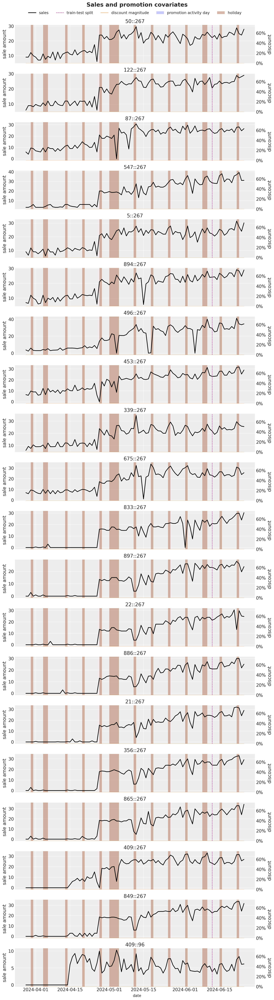

In [19]:
fig, axes = plt.subplots(
    nrows=len(plot_labels),
    figsize=(12, 2.2 * len(plot_labels)),
    sharex=True,
    layout="constrained",
)
discount_max = float(panel_ds["discount_magnitude"].max())
for ax, label in zip(axes, plot_labels, strict=True):
    (sales_line,) = ax.plot(
        dates, panel_ds["sale_amount"].sel(series=label), color="black", linewidth=2, label="sales"
    )
    split_line = ax.axvline(
        split_x, color="C3", linestyle="--", linewidth=1, label="train-test split"
    )
    activity_span = ax.fill_between(
        dates,
        0,
        1,
        where=(panel_ds["activity_flag"].sel(series=label) > 0.5).to_numpy(),
        transform=ax.get_xaxis_transform(),
        color="C0",
        alpha=0.25,
        linewidth=0,
        label="promotion activity day",
    )
    holiday_span = ax.fill_between(
        dates,
        0,
        1,
        where=(panel_ds["holiday_flag"].sel(series=label) > 0.5).to_numpy(),
        transform=ax.get_xaxis_transform(),
        color="C4",
        alpha=0.35,
        linewidth=0,
        label="holiday",
    )
    ax.set(title=label, ylabel="sale amount")
    ax_twin = ax.twinx()
    (discount_line,) = ax_twin.plot(
        dates,
        panel_ds["discount_magnitude"].sel(series=label),
        color="C1",
        alpha=0.8,
        linewidth=1,
        label="discount magnitude",
    )
    ax_twin.grid(False)
    ax_twin.yaxis.set_major_formatter(mtick.PercentFormatter(xmax=1, decimals=0))
    ax_twin.set(ylabel="discount", ylim=(0, 1.1 * discount_max))
axes[0].legend(
    handles=[sales_line, split_line, discount_line, activity_span, holiday_span],
    loc="upper center",
    bbox_to_anchor=(0.5, 1.45),
    ncol=5,
    fontsize=12,
)
fig.supxlabel("date")
fig.suptitle("Sales and promotion covariates", fontsize=18, fontweight="bold");

In [20]:
# The facet plot shows the top series only; these panel-wide shares back the
# feature-quality discussion below.
panel_covariate_shares = (
    data_lf.pipe(keep_top_series, top_series_df)
    .with_columns(cleaned_discount_magnitude())
    .group_by("store_id", "product_id")
    .agg(
        (pl.col("activity_flag") > 0).any().alias("any_activity"),
        (pl.col("discount_magnitude") > 0).any().alias("any_discount"),
        (pl.col("discount") == 0).mean().alias("placeholder_share"),
    )
    .select(
        pl.col("any_activity").mean(),
        pl.col("any_discount").mean(),
        pl.col("placeholder_share").mean(),
    )
    .collect(engine="streaming")
)
promo_share, discount_share, placeholder_share = panel_covariate_shares.row(0)
print(f"panel series with at least one active-promotion day: {promo_share:.1%}")
print(f"panel series with at least one real discount day: {discount_share:.1%}")
print(f"placeholder discount = 0 share of the panel's day-rows: {placeholder_share:.1%}")

panel series with at least one active-promotion day: 46.8%
panel series with at least one real discount day: 65.6%
placeholder discount = 0 share of the panel's day-rows: 17.7%

Two patterns jump out. The holiday flag repeats weekly (weekends plus a
solid block around the May Day week), and several series show local
sales spikes on those shaded days; promotion activity and priced
discounts, by contrast, are entirely absent from the twenty series
shown, even though roughly half of the panel’s series have active
promotion days and about two thirds see at least one real discount: the
flagship launch product that dominates both rankings is simply never
promoted. The flat discount line is also the placeholder cleanup at
work: for these series the raw `discount` column is zero on most days
(the placeholder flagged in the EDA at $0.4\%$ dataset-wide covers about
$18\%$ of this panel’s days, concentrated in exactly the launch
product), so the cleaned magnitude sits at an honest zero instead of
reading as a $100\%$ discount. This heterogeneity in feature quality is
one more argument for pooling the covariate effects by store rather than
fitting one global discount effect: where the feature is quiet the
coefficient is weakly identified and shrinks toward its store-level
prior, and where the feature is informative it can act.

## Model specification

The model is a panel state space model on the scaled sales, with five
components per series $s$:

- a random-walk local level for slow demand shifts,
- a damped AR(1) trend slope that carries the recent drift into the
  forecast window,
- a zero-sum weekly seasonal profile,
- promotion, calendar, and launch effects pooled hierarchically by
  store,
- a multiplicative availability factor with a learned floor, which also
  scales the observation noise.

$$
\begin{align*}
y_{t,s} &\sim \text{Normal}\left(f_{t,s} \, \mu_{t,s},\; f_{t,s} \left(\sigma_s + \lambda_s \, \text{softplus}(\ell_{t,s})\right) + \sigma_0\right) \\
\mu_{t,s} &= \ell_{t,s} + \gamma_{d(t),s} + \sum_{c=1}^{4} \beta_{c,s} \, x_{c,t,s} \\
\ell_{t,s} &= \ell_{0,s} + \sum_{u \le t} \left(\varepsilon_{u,s} + \delta_{u,s}\right), \qquad \varepsilon_{u,s} \sim \text{Normal}(0, \tau_s) \\
\delta_{u,s} &= \phi^{\text{trend}}_s \, \delta_{u-1,s} + \eta_{u,s}, \qquad \eta_{u,s} \sim \text{Normal}\left(0, \tau^{\text{trend}}_s\right), \quad \delta_{0,s} = 0 \\
f_{t,s} &= \phi_s + (1 - \phi_s) \, \frac{1 - e^{-b_s a_{t,s}}}{1 - e^{-b_s}} \\
\beta_{c,s} &\sim \text{Normal}\left(\mu^{\text{store}}_{c,\,m(s)},\; \sigma^{\text{store}}_{c,\,m(s)}\right)
\end{align*}
$$

where $d(t)$ is the day of week, $m(s)$ the store of series $s$,
$a_{t,s}$ the sales-weighted availability, $x_{c,t,s}$ the four
regression features (discount magnitude, promotion activity, holiday,
and the launch indicator), $\lambda_s$ the loading of the
level-dependent noise component, and $\sigma_0 = 0.02$ a small constant
basal noise; the last two are discussed with the noise scale below. The
remaining priors, all on the scaled axis where $1$ is an average day for
the series:

$$
\begin{align*}
\ell_{0,s} &\sim \text{Normal}(1, 0.5), & \tau_s &\sim \text{LogNormal}(-3, 1) \\
\phi^{\text{trend}}_s &\sim \text{Beta}(8, 2), & \tau^{\text{trend}}_s &\sim \text{LogNormal}(-4, 1) \\
\gamma_{\cdot,s} &\sim \text{ZeroSumNormal}(\sigma_\gamma, 7), & \sigma_\gamma &\sim \text{HalfNormal}(0.2) \\
\mu^{\text{store}}_{c,m} &\sim \text{Normal}(0, 0.5), & \sigma^{\text{store}}_{c,m} &\sim \text{HalfNormal}(0.3) \\
\phi_s &\sim \text{Beta}(2, 18), & b_s &\sim \text{LogNormal}(1, 0.5) \\
\sigma_s &\sim \text{HalfNormal}(0.5), & \lambda_s &\sim \text{HalfNormal}(0.2)
\end{align*}
$$

The random-walk drift $\varepsilon$ and the coefficients $\beta$ use
`LocScaleReparam` with learned centeredness parameters (each a global
$\text{Uniform}(0, 1)$ latent), as in the other hierarchical examples.
The sections below motivate the trend, dynamics, and availability-factor
priors in detail.

### The damped trend

We give each series a damped AR(1) slope on top of the random-walk level
because a $14$-day forecast needs momentum: this panel keeps drifting
upward through the test window, and only a trend state can carry that
drift past the last observed day. In the state-space scan the forecast
is seeded by the final in-sample slope, which then decays geometrically
at rate $\phi^{\text{trend}}_s < 1$ while its uncertainty keeps growing,
so the forecast inherits the current momentum without betting on it
indefinitely. The interval-diagnostics section below quantifies what
this buys on the holdout.

Alternatives that do not work here:

- **A pure random-walk level with no slope**, meaning the forecast
  freezes at the last fitted level. On a drifting panel like this one
  the interval misses then concentrate *above* the bands and grow with
  the horizon while the forecast fan barely widens, exactly the
  miscalibration signature the interval diagnostics below are built to
  detect.
- **An undamped slope** (an integrated random walk), meaning the last
  local trend is extrapolated as a straight line indefinitely.
  Fresh-retail momentum is short-lived (a promotion tail, a post-launch
  settling), so the straight line overshoots at precisely the long
  horizons where intervals are most fragile; the damping relaxes the
  trend toward zero within the horizon instead.

### The availability factor

The factor $f_{t,s}$ deserves a close look, because its three
ingredients each fix a concrete failure mode:

- **The floor $\phi_s \in (0, 1)$.** At zero recorded availability the
  factor equals $\phi_s$, not zero, so the $15\%$ of flagged stockout
  days with positive sales are explained by a small expected sale
  instead of blowing up the likelihood. The prior
  $\phi_s \sim \text{Beta}(2, 18)$ (mean $0.1$) is informed by the
  empirical floor of about $0.04$ measured above, while staying wide
  enough for series with sloppier labels.
- **The saturating link $1 - e^{-b_s a}$.** This is the classic
  random-encounter (reach) curve: if purchase attempts arrive through
  the day as a Poisson process with intensity $b_s$, and a share $a$ of
  the (sales-weighted) selling time is in stock, the probability that at
  least one attempt lands while the product is on the shelf is exactly
  $1 - e^{-b_s a}$. It matches the concave shape of the empirical curve,
  and compared to alternatives such as $\tanh$ it is cheaper (one
  exponential), has a smooth monotone gradient in $b_s$, and gives $b_s$
  a direct interpretation as purchase-opportunity intensity.
- **The normalization by $1 - e^{-b_s}$.** Without it, the factor at
  full availability is $1 - e^{-b_s} < 1$, and the model can trade the
  factor’s overall scale against the level $\ell_{t,s}$ (multiply one,
  divide the other), leaving both non-identified. Anchoring
  $f_{t,s} = 1$ at $a = 1$ removes that degeneracy: the level is the
  demand at full availability, $\phi_s$ is exactly the share of demand
  still sold on a fully flagged-out day, and $b_s$ only controls the
  curvature. Numerically we compute the ratio with `expm1`, which avoids
  the catastrophic cancellation in $1 - e^{-b_s}$ for small $b_s$, where
  the naive expression degrades toward $0/0$.

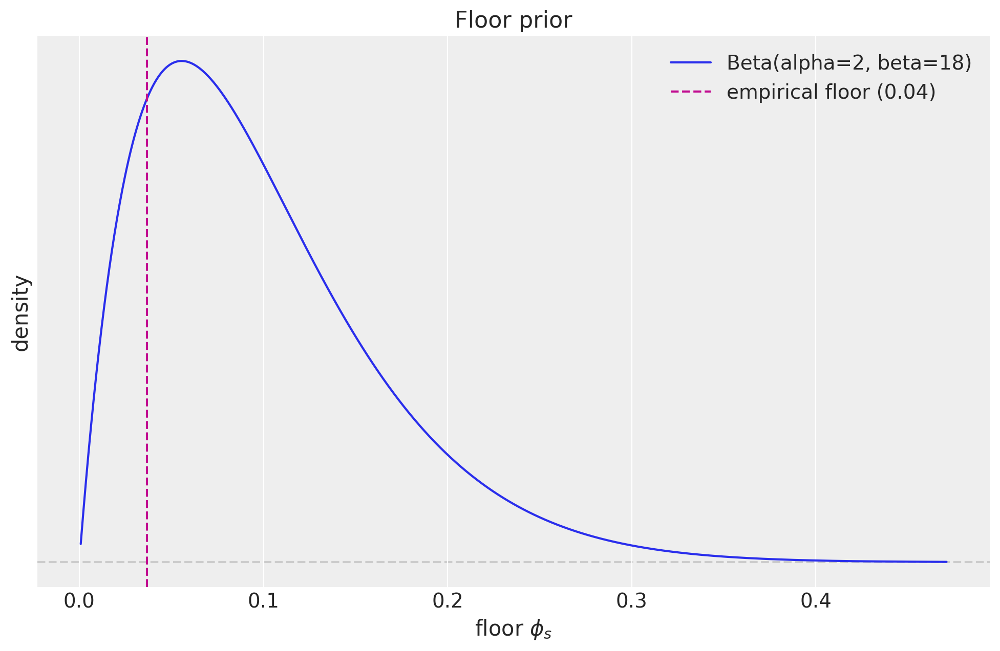

In [21]:
fig, ax = plt.subplots()
pz.Beta(2, 18).plot_pdf(color="C0", ax=ax)
ax.axvline(
    empirical_floor,
    color="C3",
    linestyle="--",
    label=f"empirical floor ({empirical_floor:.2f})",
)
ax.legend(loc="upper right")
ax.set(xlabel=r"floor $\phi_s$", ylabel="density", title="Floor prior");

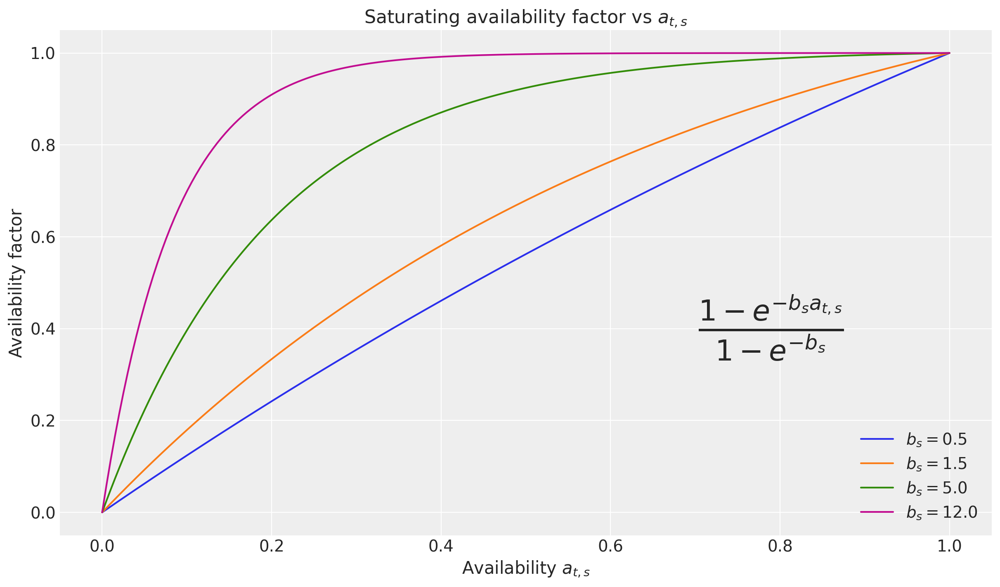

In [22]:
def availability_factor(
    availability: Float[np.ndarray | Array, " ..."] | float,
    b_avail: Float[np.ndarray | Array, " ..."] | float,
    floor: Float[np.ndarray | Array, " ..."] | float,
) -> Float[np.ndarray | Array, " ..."]:
    """Floored, normalized saturating availability factor.

    The model-specification curve
    ``floor + (1 - floor) * expm1(-b_avail * availability) / expm1(-b_avail)``:
    ``floor`` at zero availability, exactly ``1`` at full availability, with the
    curvature set by ``b_avail``. Defined once, at first use, and shared by the
    illustrative curves here, the model, and the prior/posterior diagnostic
    cells below, so the plotted curves can never drift from what the model
    computes. Inputs broadcast together per NumPy rules. NumPy and scalar
    inputs are accepted (``xarray.apply_ufunc`` passes NumPy arrays in the
    posterior diagnostic below) and computed with ``jax.numpy``.

    Parameters
    ----------
    availability
        Sales-weighted availability in ``[0, 1]``.
    b_avail
        Saturation rate (the purchase-opportunity intensity).
    floor
        The factor at zero availability, in ``(0, 1)``.

    Returns
    -------
    Array
        The multiplicative availability factor.
    """
    saturation = jnp.expm1(-b_avail * availability) / jnp.expm1(-b_avail)
    return floor + (1.0 - floor) * saturation


a_grid = jnp.linspace(0, 1, 200)  # availability from 0 to 1
b_vals = [0.5, 1.5, 5.0, 12.0]  # some example b_s values

fig, ax = plt.subplots()
for b in b_vals:
    f = availability_factor(a_grid, b, 0.0)
    ax.plot(a_grid, f, label=f"$b_s={b}$")
fig.text(0.7, 0.42, r"$\frac{1 - e^{-b_s a_{t,s}}}{1 - e^{-b_s}}$", fontsize=36)
ax.legend(loc="lower right")
ax.set(
    title="Saturating availability factor vs $a_{t,s}$",
    xlabel="Availability $a_{t,s}$",
    ylabel="Availability factor",
);

### Priors for the level and trend dynamics

Three priors govern how much the level is allowed to move, and they are
worth choosing deliberately. All live on the scaled axis, where $1$ is
an average day for the series:

- $\tau_s \sim \text{LogNormal}(-3, 1)$, the random-walk drift scale:
  median $\approx 0.05$, so a typical series may shift its level by
  around $5\%$ of an average day per step, with the long right tail
  leaving room for jumpier series.
- $\phi^{\text{trend}}_s \sim \text{Beta}(8, 2)$, the trend damping:
  mean $0.8$, so a slope shock loses about half its size in three days
  ($0.8^3 \approx 0.51$) and the extrapolated trend flattens within the
  $14$-day horizon instead of running away.
- $\tau^{\text{trend}}_s \sim \text{LogNormal}(-4, 1)$, the slope
  innovation scale: median $\approx 0.018$, deliberately well below the
  drift and observation scales, so the slope only accumulates persistent
  day-over-day signals and cannot chase daily noise.

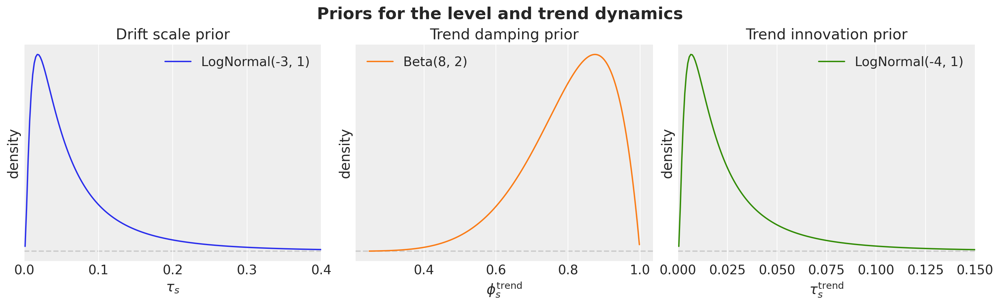

In [23]:
prior_panels = [
    (pz.LogNormal(-3, 1), "C0", "LogNormal(-3, 1)", "Drift scale prior", r"$\tau_s$", (0.0, 0.4)),
    (pz.Beta(8, 2), "C1", "Beta(8, 2)", "Trend damping prior", r"$\phi^{\mathrm{trend}}_s$", None),
    (
        pz.LogNormal(-4, 1),
        "C2",
        "LogNormal(-4, 1)",
        "Trend innovation prior",
        r"$\tau^{\mathrm{trend}}_s$",
        (0.0, 0.15),
    ),
]
fig, axes = plt.subplots(ncols=3, figsize=(15, 4.5), layout="constrained")
for ax, (prior, color, name, title, xlabel, xlim) in zip(axes, prior_panels, strict=True):
    prior.plot_pdf(color=color, legend=None, ax=ax)
    pdf_line = next(line for line in ax.lines if line.get_color() == color)
    pdf_line.set_label(name)
    ax.legend()
    ax.set(xlabel=xlabel, ylabel="density", title=title)
    if xlim is not None:
        ax.set_xlim(*xlim)
fig.suptitle("Priors for the level and trend dynamics", fontsize=18, fontweight="bold");

Finally, the noise scale is
$f_{t,s} \left(\sigma_s + \lambda_s \, \text{softplus}(\ell_{t,s})\right) + \sigma_0$.
It has three parts: a per-series base scale $\sigma_s$, a
level-dependent component $\lambda_s \, \text{softplus}(\ell_{t,s})$,
sampled as `noise_loading` in the code (busier days are noisier in
absolute terms, and its coverage payoff is quantified in the evaluation
section), and the availability factor $f_{t,s}$ shrinking the spread on
stockout days, where sales are pinned near zero. The remaining piece is
a small **constant** basal term $\sigma_0 = 0.02$ on the scaled axis,
which keeps the scale bounded away from zero. Three design questions
hide in this one constant:

- **Why not a learned basal term?** Many series sell exactly zero on
  their stockout days, where the mean is also pinned near zero. A Normal
  density at a perfectly fit point grows without bound as its scale
  shrinks, so the ELBO rewards collapsing the total noise scale at those
  observations; with a learned basal term the collapse runs away and the
  optimization hits `NaN` mid-run (the first non-finite ELBO appears
  around step $6{,}000$ on this panel). A constant cannot collapse.
- **Why not a tiny epsilon like $10^{-6}$?** The constant is not there
  to avoid division by zero; it must remove the *reward* for collapse.
  With $\sigma_0 = 10^{-6}$ the density at an exactly fit zero can still
  contribute $\log\left(1 / (\sigma_0 \sqrt{2\pi})\right) \approx 12.9$
  per observation, and such a fit banks roughly a thousand nats of ELBO
  from these spikes while every predictive metric stays identical to the
  $0.02$ fit: the “improvement” is purely the degenerate optimum being
  exploited, and stability is then at the mercy of the learning-rate
  schedule (the learned-term variant diverged through exactly this
  mechanism).
- **Why $0.02$ specifically?** It sits at the data’s resolution: one
  physical sale unit is between $0.06$ and $0.25$ on the per-series
  scaled axis, so a basal noise of $0.02$ is below measurement
  granularity and cannot distort any interval the data could support.
  Fits with $\sigma_0 \in \{0.01, 0.02, 0.05\}$ give the same CRPS and
  coverage to within noise.

In [24]:
def make_fresh_retail_model(
    series_to_store: Int[Array, " n_series"],
    n_stores: int,
    n_series: int,
    n_cov: int,
) -> ForecastModel:
    """Build a damped-trend hierarchical panel model with a floored availability factor.

    The panel shapes are fixed once, here, and the returned model function is the
    plain ``(covariates, data=None)`` callable every driver in the package
    consumes: it derives its `~~numpyro_forecast.Horizon` from the shapes
    and closes over the store index and the panel dimensions.

    Parameters
    ----------
    series_to_store
        Integer index mapping each series to its store, shape ``(n_series,)``.
    n_stores
        Number of distinct stores in the panel.
    n_series
        Number of store-product series (the trailing observation axis).
    n_cov
        Number of regression features (excluding availability).

    Returns
    -------
    ForecastModel
        The model function, callable as ``model(covariates)`` for prior sampling
        and ``model(covariates, data)`` for training and forecasting.
    """

    def fresh_retail_model(
        covariates: Float[Array, " availability_discount_activity_holiday_ramp duration n_series"],
        data: Float[Array, " t_obs n_series"] | None = None,
    ) -> None:
        """Sample the joint model (the drivers call this for training and forecasting)."""
        h = Horizon.from_data(covariates, data)
        duration = covariates.shape[-2]
        # The inputs tensor keeps time at axis -2 (the package-wide convention) with
        # the stacked inputs as a leading batch axis, named explicitly in the
        # signature: availability first, then the regression features, already
        # shaped so that `features * b[:, None, :]` broadcasts against the
        # (n_cov, n_series) coefficients. The `assert isinstance` lines are
        # jaxtyping's runtime shape guards: they share the dimension memo with the
        # signature (so `duration` and `n_series` are already bound by
        # `covariates`); plain annotated assignments would NOT be checked at runtime.
        availability = covariates[0]
        assert isinstance(availability, Float[Array, " duration n_series"])  # ty: ignore[invalid-argument-type]
        features = covariates[1:]
        assert isinstance(features, Float[Array, " n_cov duration n_series"])  # ty: ignore[invalid-argument-type]

        # Global hyperpriors. The seasonal scale must be a scalar because
        # ZeroSumNormal cannot broadcast a per-series scale over the plate.
        centered_drift = numpyro.sample("centered_drift", dist.Uniform(0.0, 1.0))
        centered_b = numpyro.sample("centered_b", dist.Uniform(0.0, 1.0))
        seasonal_scale = numpyro.sample("seasonal_scale", dist.HalfNormal(0.2))

        with numpyro.plate("store", n_stores, dim=-1):
            with numpyro.plate("covariate", n_cov, dim=-2):
                b_loc_store = cast("Array", numpyro.sample("b_loc_store", dist.Normal(0.0, 0.5)))
                b_scale_store = cast(
                    "Array", numpyro.sample("b_scale_store", dist.HalfNormal(0.3))
                )

        with numpyro.plate("series", n_series, dim=-1):
            drift_scale = numpyro.sample("drift_scale", dist.LogNormal(-3.0, 1.0))
            phi_trend = cast("Array", numpyro.sample("phi_trend", dist.Beta(8.0, 2.0)))
            tau_trend = cast("Array", numpyro.sample("tau_trend", dist.LogNormal(-4.0, 1.0)))
            init_level = cast("Array", numpyro.sample("init_level", dist.Normal(1.0, 0.5)))
            b_avail = cast("Array", numpyro.sample("b_avail", dist.LogNormal(1.0, 0.5)))
            floor = cast("Array", numpyro.sample("floor", dist.Beta(2.0, 18.0)))
            sigma = cast("Array", numpyro.sample("sigma", dist.HalfNormal(0.5)))
            noise_loading = cast("Array", numpyro.sample("noise_loading", dist.HalfNormal(0.2)))
            seasonal = cast(
                "Array",
                numpyro.sample("seasonal", dist.ZeroSumNormal(seasonal_scale, event_shape=(7,))),
            )
            with numpyro.plate("covariate", n_cov, dim=-2):
                with handlers.reparam(config={"b": LocScaleReparam(centered=centered_b)}):
                    b = cast(
                        "Array",
                        numpyro.sample(
                            "b",
                            dist.Normal(
                                b_loc_store[:, series_to_store],
                                b_scale_store[:, series_to_store],
                            ),
                        ),
                    )
            # innovations opens its own time plate at dim=-2, so the covariate
            # plate above must already be closed here.
            drift = innovations(
                h,
                "drift",
                lambda: dist.Normal(0.0, drift_scale),
                reparam=LocScaleReparam(centered=centered_drift),
            )

        # The damped AR(1) slope is a Markov latent: markov_series scans over
        # time (and must be called outside the series plate; the per-series
        # parameters enter through the closure), seeds the forecast scan with the
        # final in-sample slope, and returns the latent in the package layout
        # (duration, n_series).
        def slope_transition(
            carry: Array, _: Array | None
        ) -> tuple[dist.Distribution, Callable[[Array], Array]]:
            return dist.Normal(phi_trend * carry, tau_trend), lambda value: value

        slope = markov_series(h, "slope", jnp.zeros(n_series), slope_transition)
        level = init_level + jnp.cumsum(drift, axis=-2) + jnp.cumsum(slope, axis=-2)
        seasonal_rep = periodic_repeat(seasonal.T, duration, axis=-2)
        covariates_contribution = (features * b[:, None, :]).sum(axis=0)
        factor = cast("Array", availability_factor(availability, b_avail, floor))
        mu = factor * (level + seasonal_rep + covariates_contribution)
        # The constant basal noise bounds the likelihood at exact-zero sales: a
        # learned basal term collapses there and NaNs the optimization, and a tiny
        # epsilon (e.g. 1e-6) leaves that degenerate optimum in play; 0.02 sits just
        # below one physical sale unit on the scaled axis (see the markdown above).
        sigma_t = factor * (sigma + noise_loading * jax.nn.softplus(level)) + 0.02
        predict(h, lambda m: dist.Normal(m, sigma_t), mu)

    return fresh_retail_model


model = make_fresh_retail_model(
    series_to_store=series_to_store,
    n_stores=n_stores,
    n_series=n_series,
    n_cov=n_covariates,
)

Let us visualize the model structure:

In [25]:
numpyro.render_model(
    model,
    model_args=(covariates_train, y_train),
    render_distributions=True,
)

## Prior predictive checks

First the factor itself: the priors on $\phi_s$ and $b_s$ should cover
both gentle and sharp saturation, with the floor concentrated near the
empirical value but not glued to it.

The plots in this and the following sections lean on the package helper
`predictions_to_datatree`: it packs raw prediction-draw arrays (possibly
rescaled, clipped, or subset) into the DataTree layout that `az.plot_lm`
needs for per-series faceting, with the independent variable broadcast
per series in `constant_data`. It complements rather than duplicates
`to_datatree`, which is posterior-centric (it runs its own predictive
from a posterior and stores covariates, not a faceting grid). On our
side of that boundary, every predictive ensemble gets wrapped in a
`DataArray` with named `time` and `series` coordinates (the small
`draws_to_da` helper below), so subsetting for a plot is a label-based
`.sel(series=...)` rather than a positional index expression.

Every banded plot shares two styling conventions, set once here. The
`hdi_label` helper formats the legend entries from the probability
itself (the `\%` escape is what mathtext requires), and each
`az.plot_lm` call maps the band transparency explicitly onto the `prob`
dimension via `aes={"alpha": ["prob"]}` with the `hdi_alphas` values
below, so the narrower $50\%$ band sits more opaque on top of the
lighter $94\%$ band in every figure.

In [26]:
def hdi_label(prob: float, prefix: str = "") -> str:
    r"""Legend label for an HDI band, e.g. ``$94\%$ HDI``."""
    percent = f"{prob:.0%}".replace("%", r"\%")
    return f"{prefix}${percent}$ HDI"


hdi_probs = (0.5, 0.94)
hdi_alphas = [0.6, 0.3]

/Users/juanitorduz/Documents/numpyro_forecast/.venv/lib/python3.14/site-packages/arviz_plots/plots/lm_plot.py:360: UserWarning: When multiple credible intervals are plotted, it is recommended to map 'alpha' aesthetic to 'prob' dimension to differentiate between intervals.
  warnings.warn(

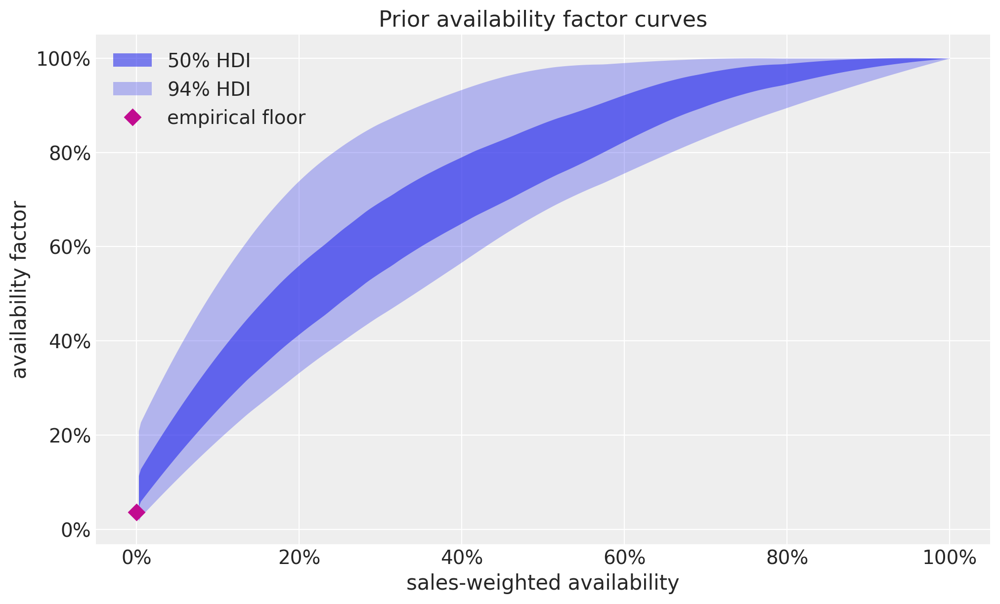

In [27]:
availability_grid = np.linspace(0.0, 1.0, 101)
rng_key, key_floor, key_b = random.split(rng_key, 3)
floor_prior = dist.Beta(2.0, 18.0).sample(key_floor, (500,))
b_prior = dist.LogNormal(1.0, 0.5).sample(key_b, (500,))
grid_jax = jnp.asarray(availability_grid, dtype=jnp.float32)
factor_prior = availability_factor(grid_jax, b_prior[:, None], floor_prior[:, None])

pc = az.plot_lm(
    predictions_to_datatree(
        np.asarray(factor_prior)[:, :, None],
        availability_grid,
        ["prior factor"],
        group="prior_predictive",
    ),
    y="obs",
    x="t",
    plot_dim="time",
    group="prior_predictive",
    ci_kind="hdi",
    ci_prob=hdi_probs,
    smooth=True,
    visuals={
        "ci_band": {"color": "C0"},
        "observed_scatter": False,
        "pe_line": False,
        "xlabel": False,
        "ylabel": False,
    },
    aes={"alpha": ["prob"]},
    alpha=hdi_alphas,
    figure_kwargs={"figsize": (10, 6)},
)
ax = pc.get_target("t", {"series": "prior factor"})
ax.plot(0.0, empirical_floor, "D", color="C3", markersize=8, label="empirical floor")
bands = pc.viz["ci_band"]["t"].sel(series="prior factor")
for prob in (0.94, 0.5):
    bands.sel(prob=prob).item().set_label(hdi_label(prob))
ax.legend(loc="upper left")
ax.xaxis.set_major_formatter(mtick.PercentFormatter(xmax=1, decimals=0))
ax.yaxis.set_major_formatter(mtick.PercentFormatter(xmax=1, decimals=0))
ax.set(
    xlabel="sales-weighted availability",
    ylabel="availability factor",
    title="Prior availability factor curves",
);

Next the full prior predictive on the training window for our six focus
series, with the scaled observations overlaid. We want wide but sane
bands on the unit scale of the normalized data. The bands also dip below
zero: a Normal likelihood on the scaled axis pays for its simplicity
with prior (and posterior) mass on negative sales, a compromise we
accept here and revisit in the next steps with a strictly positive
observation model.

/Users/juanitorduz/Documents/numpyro_forecast/.venv/lib/python3.14/site-packages/arviz_plots/plots/lm_plot.py:360: UserWarning: When multiple credible intervals are plotted, it is recommended to map 'alpha' aesthetic to 'prob' dimension to differentiate between intervals.
  warnings.warn(

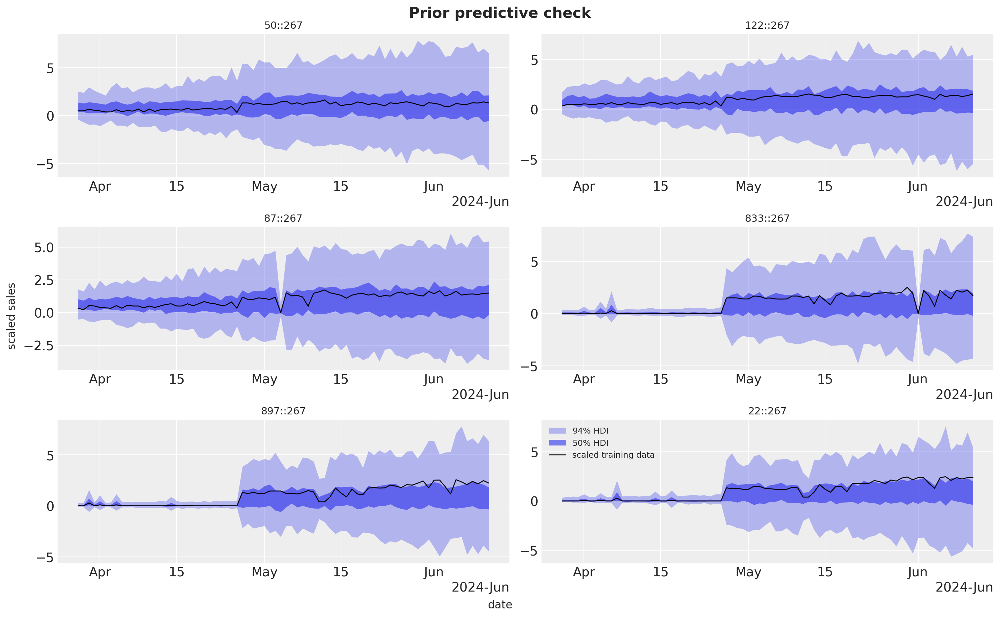

In [28]:
def draws_to_da(
    draws: Float[np.ndarray | Array, " sample time n_series"],
    time_values: np.ndarray,
) -> xr.DataArray:
    """Wrap prediction draws in a DataArray with named time and series coordinates."""
    return xr.DataArray(
        np.asarray(draws),
        dims=["sample", "time", "series"],
        coords={"time": time_values, "series": series_ids},
    )


rng_key, key_prior = random.split(rng_key)
prior_obs = Predictive(model, num_samples=500, return_sites=["obs"])(key_prior, covariates_train)[
    "obs"
]
prior_obs_da = draws_to_da(prior_obs, dates[:t_train])

pc = az.plot_lm(
    predictions_to_datatree(
        prior_obs_da.sel(series=focus_labels).to_numpy(),
        dates_num[:t_train],
        focus_labels,
        group="prior_predictive",
    ),
    y="obs",
    x="t",
    plot_dim="time",
    group="prior_predictive",
    ci_kind="hdi",
    ci_prob=hdi_probs,
    smooth=False,
    col_wrap=2,
    visuals={
        "ci_band": {"color": "C0"},
        "observed_scatter": False,
        "pe_line": False,
        "xlabel": False,
        "ylabel": False,
    },
    aes={"alpha": ["prob"]},
    alpha=hdi_alphas,
    figure_kwargs={"figsize": (15, 9)},
)
truth_da = (
    y_scaled.isel(time=slice(None, t_train))
    .sel(series=focus_labels)
    .assign_coords(time=dates_num[:t_train])
    .rename("t")
)
x_da = xr.DataArray(dates_num[:t_train], dims=["time"], coords={"time": dates_num[:t_train]})
pc.map(
    az.visuals.line_xy,
    "truth",
    data=truth_da,
    x=x_da,
    ignore_aes=pc.aes_set,
    color="black",
    lw=1,
)
for label in focus_labels:
    ax = pc.get_target("t", {"series": label})
    ax.set_title(label, fontsize=11)
    locator = mdates.AutoDateLocator()
    ax.xaxis.set_major_locator(locator)
    ax.xaxis.set_major_formatter(mdates.ConciseDateFormatter(locator))
ax0 = pc.get_target("t", {"series": focus_labels[-1]})
bands = pc.viz["ci_band"]["t"].sel(series=focus_labels[-1])
band_handles = []
for prob in (0.94, 0.5):
    band = bands.sel(prob=prob).item()
    band.set_label(hdi_label(prob))
    band_handles.append(band)
truth_line = pc.viz["truth"]["t"].sel(series=focus_labels[-1]).item()
truth_line.set_label("scaled training data")
ax0.legend(handles=[*band_handles, truth_line], loc="upper left", fontsize=9)
fig = pc.viz["figure"].item()
fig.supxlabel("date")
fig.supylabel("scaled sales")
fig.suptitle("Prior predictive check", fontsize=16, fontweight="bold", y=1.02)
# The raw prior draws are a multi-GB device buffer at panel scale; the plot
# above holds a NumPy copy, so release the device memory here.
del prior_obs

## Inference with SVI

We fit with NumPyro’s `SVI` against an explicit `AutoNormal` guide.
Instead of a fixed learning rate we pass a custom `optax` optimizer, the
one-cycle Adam schedule chained with `reduce_on_plateau`, which
converges noticeably better on this panel (the same recipe as in the
[inference methods comparison](inference_methods_comparison.html)
example); `SVI` expects a NumPyro optimizer, so the optax chain goes
through one line of glue, `numpyro.optim.optax_to_numpyro`.

We set `progress_bar=False`, and not only because the scanned update
loop compiles to a single `lax.scan` that finishes all $60{,}000$ steps
in a few seconds on CPU. The step-by-step execution path behind the
progress bar compiles to slightly different floating-point arithmetic,
and on this panel that tiny perturbation is enough to steer the
optimizer into a distinctly worse ELBO optimum (the evaluation section
returns to this sensitivity). The scanned path is both the fast and the
well-behaved one here.

In [29]:
%%time

num_steps = 60_000

scheduler = optax.linear_onecycle_schedule(
    transition_steps=num_steps,
    peak_value=0.001,
    pct_start=0.3,
    pct_final=0.85,
    div_factor=2,
    final_div_factor=3,
)

optimizer = optax.chain(
    optax.adam(learning_rate=scheduler),
    optax.contrib.reduce_on_plateau(
        factor=0.8,
        patience=20,
        accumulation_size=100,
    ),
)

rng_key, key_fit = random.split(rng_key)
guide = AutoNormal(model)
svi = SVI(model, guide, optax_to_numpyro(optimizer), Trace_ELBO())
svi_result = svi.run(
    key_fit,
    num_steps,
    covariates_train,
    y_train,
    progress_bar=False,
)

CPU times: user 14.5 s, sys: 732 ms, total: 15.2 s
Wall time: 8.83 s

CPU times: user 9min 30s, sys: 6min 29s, total: 15min 59s
Wall time: 3min 21s

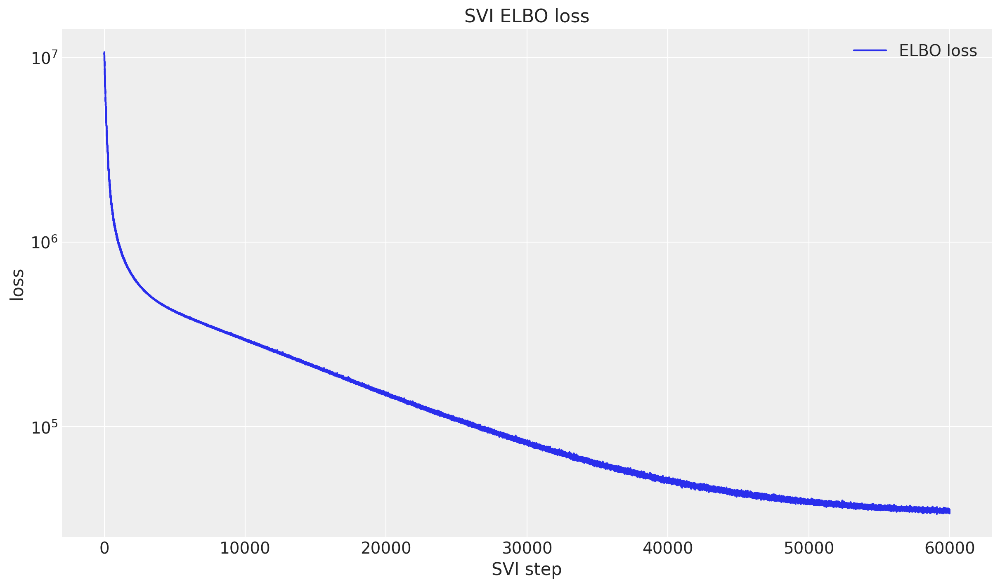

In [30]:
%%time

fig, ax = plt.subplots()
ax.plot(svi_result.losses, color="C0", label="ELBO loss")
ax.legend(loc="upper right")
ax.set(yscale="log", xlabel="SVI step", ylabel="loss", title="SVI ELBO loss");

## Draw the posterior once

The fit leaves us with a guide and its learned `params`;
`draw_posterior` turns that pair into a dict of latent samples with a
leading sample axis. We draw it **once**, here, and hand the same dict
to everything downstream: the `DataTree` export below and the scoring
section further down both read `posterior_draws`, so the tree and the
metrics table describe literally the same $1{,}000$ posterior samples
rather than two independently drawn ensembles.

This is also where memory peaks on an accelerator, twice over: drawing
the posterior materializes every latent and deterministic site for all
$1{,}000$ draws at once (on a wide panel this is the single largest
allocation of the whole notebook), and the in-sample predictive and the
forecast would each add another full `(sample, time, series)` array on
top, which is exactly how this notebook ran out of memory on a GPU
instance. Both stages take a chunk size. Here `batch_size=250` samples
the guide $250$ draws at a time and `device="host"` moves each chunk to
host memory before the next one is drawn, so the accelerator only ever
holds one chunk; the same `250` reappears as `predictive_batch_size` on
the export below and as `batch_size` in the scoring section, where it
bounds the predictive passes the same way. Chunking only changes the
PRNG stream layout (draws are reproducible per `rng_key` and batch
size); on this CPU run it is purely a demonstration.

In [31]:
rng_key, key_post = random.split(rng_key)
posterior_draws = draw_posterior(
    key_post, guide, svi_result.params, 1_000, batch_size=250, device="host"
)

## Export to an ArviZ DataTree

A single `to_datatree` call wraps the rest: it takes the posterior
draws, runs the in-sample posterior predictive, and, because the
covariates extend $14$ days past the training data, also generates the
forecast and stores it in the `predictions` group. We label every
dimension so downstream selections read naturally; in particular,
`covariate_dims` tells the export the covariates are an
`(input, time, series)` tensor, so `constant_data` keeps the layout the
model consumes instead of a flattened matrix, with the five inputs named
on the `input` coordinate. `predictive_batch_size=250` chunks the two
predictive passes exactly as `batch_size` chunked the posterior draw
above.

In [32]:
first_weekday = int(dates_series.dt.weekday()[0])
day_names = ["Mon", "Tue", "Wed", "Thu", "Fri", "Sat", "Sun"]
dow_labels = [day_names[(first_weekday - 1 + offset) % 7] for offset in range(7)]

rng_key, key_tree = random.split(rng_key)
tree = to_datatree(
    key_tree,
    model,
    posterior_draws,
    y_train,
    covariates,
    predictive_batch_size=250,
    time_coord=list(dates),
    covariate_dims=["input", "time", "series"],
    coords={
        "series": series_ids,
        "obs_dim": series_ids,
        "store": store_ids,
        "covariate": covariate_names,
        "input": input_names,
        "day_of_week": dow_labels,
    },
    posterior_dims={
        "drift": ["time", "series"],
        "drift_decentered": ["time", "series"],
        "slope": ["time", "series"],
        "seasonal": ["series", "day_of_week"],
        "b": ["covariate", "series"],
        "b_decentered": ["covariate", "series"],
        "b_loc_store": ["covariate", "store"],
        "b_scale_store": ["covariate", "store"],
        "drift_scale": ["series"],
        "phi_trend": ["series"],
        "tau_trend": ["series"],
        "init_level": ["series"],
        "b_avail": ["series"],
        "floor": ["series"],
        "sigma": ["series"],
        "noise_loading": ["series"],
    },
)
tree

<xarray.DataTree>
Group: /
│ Attributes:
│ inference_library: numpyro
│ creation_library: numpyro_forecast
│ sample_dims: ['chain', 'draw']
├── Group: /posterior
│ Dimensions: (chain: 1, draw: 1000, covariate: 4, series: 1000,
│ store: 525, time: 76, day_of_week: 7)
│ Coordinates:
│ * chain (chain) int64 8B 0
│ * draw (draw) int64 8kB 0 1 2 3 4 5 6 ... 994 995 996 997 998 999
│ * covariate (covariate) <U18 288B 'discount_magnitude' ... 'post_ramp'
│ * series (series) <U8 32kB '0::117' '0::691' ... '99::589' '9::4'
│ * store (store) int64 4kB 0 1 2 3 4 5 ... 891 892 893 894 896 897
│ * time (time) datetime64[s] 608B 2024-03-28 ... 2024-06-11
│ * day_of_week (day_of_week) <U3 84B 'Thu' 'Fri' 'Sat' ... 'Tue' 'Wed'
│ Data variables: (12/19)
│ b (chain, draw, covariate, series) float32 16MB 0.7183 .....
│ b_avail (chain, draw, series) float32 4MB 0.9061 0.8295 ... 11.12
│ b_decentered (chain, draw, covariate, series) float32 16MB 0.2872 .....
│ b_loc_store (chain, draw, covariate, store) float32 8MB 0.6634 ... ...
│ b_scale_store (chain, draw, covariate, store) float32 8MB 0.423 ... 0...
│ centered_b (chain, draw) float32 4kB 0.279 0.282 ... 0.2804 0.2805
│ ... ...
│ phi_trend (chain, draw, series) float32 4MB 0.4502 0.3519 ... 0.4466
│ seasonal (chain, draw, series, day_of_week) float32 28MB 0.00966...
│ seasonal_scale (chain, draw) float32 4kB 0.04305 0.04319 ... 0.04307
│ sigma (chain, draw, series) float32 4MB 0.1733 0.1775 ... 0.365
│ slope (chain, draw, time, series) float32 304MB -0.0333 ... -...
│ tau_trend (chain, draw, series) float32 4MB 0.02123 ... 0.04093
│ Attributes:
│ created_at: 2026-08-21T13:23:42.625853+00:00
│ creation_library: ArviZ
│ creation_library_version: 1.2.0
│ creation_library_language: Python
│ sample_dims: ['chain', 'draw']
├── Group: /posterior_predictive
│ Dimensions: (chain: 1, draw: 1000, time: 76, obs_dim: 1000)
│ Coordinates:
│ * chain (chain) int64 8B 0
│ * draw (draw) int64 8kB 0 1 2 3 4 5 6 7 ... 993 994 995 996 997 998 999
│ * time (time) datetime64[s] 608B 2024-03-28 2024-03-29 ... 2024-06-11
│ * obs_dim (obs_dim) <U8 32kB '0::117' '0::691' '0::70' ... '99::589' '9::4'
│ Data variables:
│ obs (chain, draw, time, obs_dim) float32 304MB 0.06866 ... 0.4252
│ Attributes:
│ created_at: 2026-08-21T13:23:43.741282+00:00
│ creation_library: ArviZ
│ creation_library_version: 1.2.0
│ creation_library_language: Python
│ sample_dims: ['chain', 'draw']
├── Group: /observed_data
│ Dimensions: (time: 76, obs_dim: 1000)
│ Coordinates:
│ * time (time) datetime64[s] 608B 2024-03-28 2024-03-29 ... 2024-06-11
│ * obs_dim (obs_dim) <U8 32kB '0::117' '0::691' '0::70' ... '99::589' '9::4'
│ Data variables:
│ obs (time, obs_dim) float32 304kB 0.06142 0.8523 1.193 ... 1.541 0.3627
│ Attributes:
│ created_at: 2026-08-21T13:23:43.741925+00:00
│ creation_library: ArviZ
│ creation_library_version: 1.2.0
│ creation_library_language: Python
│ sample_dims: []
├── Group: /constant_data
│ Dimensions: (input: 5, time: 76, series: 1000)
│ Coordinates:
│ * input (input) <U18 360B 'availability' ... 'post_ramp'
│ * time (time) datetime64[s] 608B 2024-03-28 2024-03-29 ... 2024-06-11
│ * series (series) <U8 32kB '0::117' '0::691' '0::70' ... '99::589' '9::4'
│ Data variables:
│ covariates (input, time, series) float32 2MB 0.0 0.8421 0.9677 ... 1.0 1.0
│ Attributes:
│ created_at: 2026-08-21T13:23:43.742464+00:00
│ creation_library: ArviZ
│ creation_library_version: 1.2.0
│ creation_library_language: Python
│ sample_dims: []
├── Group: /predictions
│ Dimensions: (chain: 1, draw: 1000, time: 14, obs_dim: 1000)
│ Coordinates:
│ * chain (chain) int64 8B 0
│ * draw (draw) int64 8kB 0 1 2 3 4 5 6 7 ... 993 994 995 996 997 998 999
│ * time (time) datetime64[s] 112B 2024-06-12 2024-06-13 ... 2024-06-25
│ * obs_dim (obs_dim) <U8 32kB '0::117' '0::691' '0::70' ... '99::589' '9::4'
│ Data variables:
│ obs (chain, draw, time, obs_dim) float32 56MB 0.5716 0.3891 ... 2.662
│ Attributes:
│ created_at: 2026-08-21T13:23:45.018843+00:00
│ creation_

## Forecast evaluation: CRPS and coverage

We score on the original sales scale (rescaling the draws by each
series’ training mean and clipping negatives at zero, since sales are
non-negative). CRPS is a proper scoring rule for probabilistic forecasts
that generalizes the mean absolute error; coverage checks calibration by
asking how often the central $94\%$ and $50\%$ intervals contain the
truth. One terminology note to keep the sections consistent: the
coverage metrics score *central* (equal-tailed) intervals bounded by
fixed quantiles, while the forecast figures further below draw *HDI*
bands; for a near-symmetric predictive the two nearly coincide, but on
zero-clipped stockout days, where the predictive piles mass at zero,
they can differ. As a reference point we use a seasonal-naive ensemble:
the weekday-aligned $14$-day windows from the training data, stacked as
an empirical forecast distribution.

We score with `predict_in_sample` and `forecast` run on the very same
`posterior_draws` the DataTree export consumed, so the metrics below and
the tree describe one posterior, not two. The $1{,}000$ draws are set by
the far tails: each $3\%$ tail of the central $94\%$ interval rests on
about $30$ of them, which makes the tail quantiles the noisiest part of
the whole evaluation. On this panel the estimate is nevertheless
comfortable: rescoring with only the first $500$ draws moves both
coverages by about a hundredth (printed below the table). The scoring
path gets the same memory guard as the DataTree export: `batch_size=250`
chunks the predictive sampling, and `device="host"` commits every chunk
(and the stitched ensemble) to the CPU backend device as a jax Array in
pageable host memory, which is what keeps the full predictive arrays off
the accelerator when this notebook runs on a GPU (when the JAX CPU
backend is not initialized, for example after
`numpyro.set_platform("cuda")` or under a `JAX_PLATFORMS` preset, the
same call returns NumPy arrays instead: each chunk is copied with
`jax.device_get`, so it needs no CPU backend and no pinned memory;
pinned host memory, a pool capped at $64$ GB by default on CUDA, is used
only when you ask for `device="pinned_host"`). The package’s own drivers
and every evaluation metric accept these host arrays directly in either
form, and `np.asarray` views one as NumPy without a copy for our own
rescaling and clipping below. A host-committed jax array is not a
drop-in for a device array in your own `jnp` code: mixed with an
uncommitted array an op runs on the CPU, mixed with an
accelerator-committed array it raises, so convert explicitly at that
boundary. The rest of the scoring keeps the ensembles in host memory end
to end: the rescaling and zero-clipping run in NumPy, and the metrics
evaluate in chunks of `batch_size` data cells (`eval_crps` /
`eval_coverage`), so the accelerator never re-materializes the full
ensemble either.

In [33]:
def seasonal_naive_ensemble(
    y_history: Float[np.ndarray, " t_hist n_series"],
    horizon: int,
    period: int = 7,
) -> Float[np.ndarray, " n_windows horizon n_series"]:
    """Stack weekday-aligned historical windows as an empirical forecast ensemble.

    Window ``k`` starts ``k * period`` days before the end of the history and spans
    ``horizon`` days, so every window is weekday-aligned with the forecast window.
    Windows that would run past the end of the history are dropped (for
    ``horizon > period`` the most recent start is skipped).
    """
    t_hist = y_history.shape[0]
    windows = []
    k = 1
    while t_hist - k * period >= 0:
        start = t_hist - k * period
        if start + horizon <= t_hist:
            windows.append(y_history[start : start + horizon])
        k += 1
    return np.stack(windows)


# Number of flattened (time, series) cells each metric evaluates on the
# accelerator per pass: below this cell count the single-pass kernel runs, so
# on this panel it is a demonstration, while on a much wider panel the same
# call keeps device memory bounded by sample x metric_cell_batch values.
metric_cell_batch = 500_000


def metrics_table(
    pred_train: Float[np.ndarray, " sample t_train n_series"],
    pred_test: Float[np.ndarray, " sample horizon n_series"],
    naive_test: Float[np.ndarray, " n_windows horizon n_series"],
    y_train_true: Float[Array, " t_train n_series"] | Float[np.ndarray, " t_train n_series"],
    y_test_true: Float[Array, " horizon n_series"] | Float[np.ndarray, " horizon n_series"],
) -> pl.DataFrame:
    """Build the CRPS and coverage summary for train, test, and the naive baseline.

    All inputs are on the original sales scale; coverage is not meaningful for the
    small naive ensemble, so its cells stay null.
    """
    return pl.DataFrame(
        {
            "split": ["model (train)", "model (test)", "seasonal naive (test)"],
            "crps": [
                float(eval_crps(pred_train, y_train_true, batch_size=metric_cell_batch)),
                float(eval_crps(pred_test, y_test_true, batch_size=metric_cell_batch)),
                float(eval_crps(naive_test, y_test_true, batch_size=metric_cell_batch)),
            ],
            "coverage_94": [
                float(
                    eval_coverage(
                        pred_train, y_train_true, alpha=0.94, batch_size=metric_cell_batch
                    )
                ),
                float(
                    eval_coverage(pred_test, y_test_true, alpha=0.94, batch_size=metric_cell_batch)
                ),
                None,
            ],
            "coverage_50": [
                float(
                    eval_coverage(
                        pred_train, y_train_true, alpha=0.5, batch_size=metric_cell_batch
                    )
                ),
                float(
                    eval_coverage(pred_test, y_test_true, alpha=0.5, batch_size=metric_cell_batch)
                ),
                None,
            ],
        }
    )


rng_key, key_score_in, key_score_fc = random.split(rng_key, 3)
# device="host" keeps the draws in pageable host memory: jax arrays committed to
# the CPU device when that backend is initialized, NumPy arrays otherwise.
# np.asarray is a zero-copy view either way, so the rescale-and-clip below runs
# in NumPy on the host and the ensembles never touch the accelerator.
pp_scaled = np.asarray(
    predict_in_sample(
        key_score_in, model, posterior_draws, covariates_train, batch_size=250, device="host"
    )
)
fc_scaled = np.asarray(
    forecast(
        key_score_fc, model, posterior_draws, y_train, covariates, batch_size=250, device="host"
    )
)
scale_np = np.asarray(scale_jax)
pred_train = np.clip(pp_scaled * scale_np[None, None, :], 0.0, None)
pred_test = np.clip(fc_scaled * scale_np[None, None, :], 0.0, None)
naive_test = seasonal_naive_ensemble(
    panel_ds["sale_amount"].isel(time=slice(None, t_train)).to_numpy(), horizon=horizon
).astype(np.float32)
# Named views of the scored ensembles for the diagnostics and plots below; the
# metric helpers keep consuming the raw arrays.
pred_train_da = draws_to_da(pred_train, dates[:t_train])
pred_test_da = draws_to_da(pred_test, dates[t_train:])
y_test_da = panel_ds["sale_amount"].isel(time=slice(t_train, None))

results_df = metrics_table(pred_train, pred_test, naive_test, y_train_original, y_test_original)
crps_test_model = float(results_df["crps"][1])
crps_test_naive = float(results_df["crps"][2])
results_df

In [34]:
for alpha, column in ((0.94, "coverage_94"), (0.5, "coverage_50")):
    coverage_500 = float(
        eval_coverage(pred_test[:500], y_test_original, alpha=alpha, batch_size=metric_cell_batch)
    )
    delta = coverage_500 - float(results_df[column][1])
    print(
        f"test coverage at {alpha:.0%} from the first 500 draws: "
        f"{coverage_500:.3f} (moves by {delta:+.4f})"
    )

test coverage at 94% from the first 500 draws: 0.925 (moves by -0.0114)
test coverage at 50% from the first 500 draws: 0.554 (moves by -0.0066)

The model beats the seasonal-naive baseline on test CRPS by a wide
margin. Calibration is more nuanced: on the holdout the $50\%$ interval
covers $56\%$, a few points above nominal, while the $94\%$ interval
covers $93.7\%$, a slight under-coverage; in-sample, both intervals
*over*-cover ($0.98$ and $0.71$). The per-day diagnostics below show
that these aggregates hide structure worth dissecting. Before that, two
of the modeling choices above earn their place directly in these
numbers:

- **The damped trend is what keeps the coverage from decaying with the
  horizon.** Without it (a pure random-walk level), the median forecast
  percentile of the truth starts near the middle of the fan and climbs
  steadily through the horizon while the fan itself barely widens: the
  frozen level cannot extrapolate the panel’s upward drift, so the
  interval misses pile up above the bands. With the slope, test CRPS and
  both coverages improve together, most visibly on the late-horizon days
  (the level-dependent noise term
  $\lambda_s \, \text{softplus}(\ell_{t,s})$ plays the same role for the
  in-sample spread).
- **The cleaned discount encoding and the launch indicator remove a
  spurious optimum.** Without them, the placeholder discount days hand
  the optimizer a second ELBO optimum in which a launch-aligned discount
  step absorbs each series’ launch jump with coefficients an order of
  magnitude too large, and which basin a run lands in depends on nothing
  more than the compilation path of the update loop (the progress-bar
  path lands badly; the scanned path lands well). With them, no
  execution path produces runaway coefficients, and the store-hierarchy
  plot further below hugs the identity line. The optimization as such
  remains sensitive to the update-loop compilation on a panel this
  large, which is why the fit above pins the well-behaved `lax.scan`
  path with `progress_bar=False`.

One artifact to rule out before reading the coverage numbers at face
value is the point mass at zero: the draws are clipped at zero and sales
are exactly zero on stockout days, so whenever the interval’s lower edge
touches zero a zero-sales day is covered “for free”, which could flatter
the coverage without the forecast earning it. The panel makes this easy
to check:

In [35]:
zero_mask = y_test_da == 0.0
quantiles = pred_test_da.quantile([0.03, 0.25, 0.75, 0.97], dim="sample")
inside50 = (y_test_da >= quantiles.sel(quantile=0.25)) & (
    y_test_da <= quantiles.sel(quantile=0.75)
)
inside94 = (y_test_da >= quantiles.sel(quantile=0.03)) & (
    y_test_da <= quantiles.sel(quantile=0.97)
)
print(f"test observations with zero sales: {float(zero_mask.mean()):.1%}")
print(
    f"50% coverage | zero-sales days: {float(inside50.where(zero_mask).mean()):.2f} | "
    f"positive days: {float(inside50.where(~zero_mask).mean()):.2f}"
)
print(
    f"94% coverage | zero-sales days: {float(inside94.where(zero_mask).mean()):.2f} | "
    f"positive days: {float(inside94.where(~zero_mask).mean()):.2f}"
)

test observations with zero sales: 1.7%
50% coverage | zero-sales days: 0.34 | positive days: 0.56
94% coverage | zero-sales days: 0.86 | positive days: 0.94

The artifact is ruled out. Zero-sales days are rare in this test panel
($1.7\%$: these are the top sellers, and the test window sits after the
launch with mostly high availability), and on them the intervals cover
*less* than nominal, since the factor floor and the level often push the
whole central band strictly above zero. The positive-sales days ($0.56$
and $0.94$) sit almost exactly at the panel-wide coverages, so the
aggregate numbers reflect ordinary days, not zero-day bookkeeping. What
the aggregates do hide is a drift over the horizon, which the per-day
plots below make visible; the in-sample over-coverage already hints at
one half of the story (daily sales fluctuations are heavier-tailed than
a Normal, so the fitted noise scale widens the whole bell to accommodate
the tail days, and in-sample the central band over-covers at $0.71$).
The per-day breakdown shows where the CRPS margin comes from:

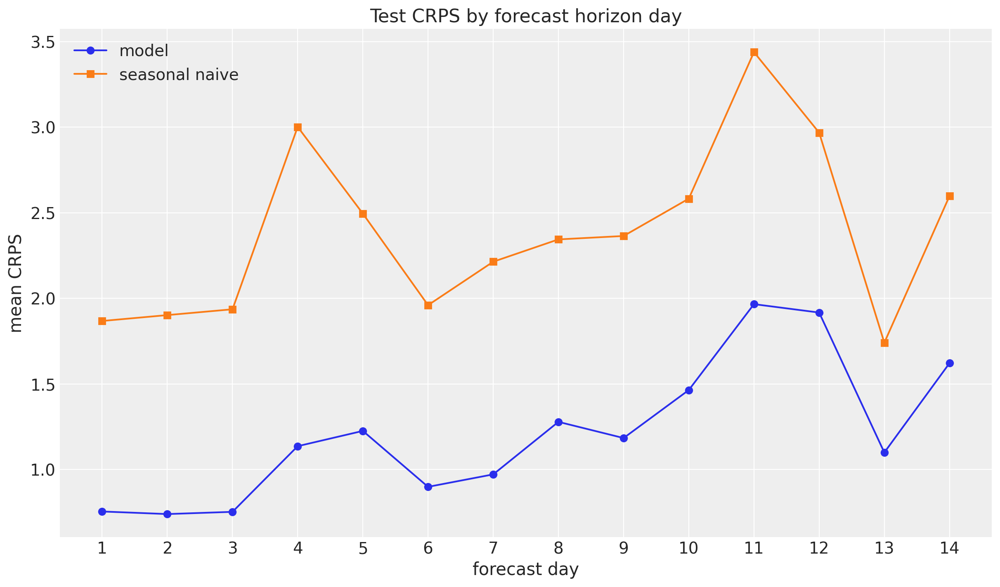

In [36]:
def crps_by_day(
    pred: Float[np.ndarray, " sample horizon n_series"],
    y_true: Float[Array, " horizon n_series"] | Float[np.ndarray, " horizon n_series"],
) -> xr.DataArray:
    """Mean CRPS per forecast day, averaged over the series of the test window."""
    per_day_series = xr.DataArray(
        np.asarray(crps_empirical(pred, y_true)),
        dims=["time", "series"],
        coords={"time": dates[t_train:], "series": series_ids},
    )
    return per_day_series.mean("series")


crps_by_day_model = crps_by_day(pred_test, y_test_original)
crps_by_day_naive = crps_by_day(naive_test, y_test_original)

fig, ax = plt.subplots()
ax.plot(np.arange(1, horizon + 1), crps_by_day_model, marker="o", color="C0", label="model")
ax.plot(
    np.arange(1, horizon + 1), crps_by_day_naive, marker="s", color="C1", label="seasonal naive"
)
ax.legend(loc="upper left")
ax.set(
    xlabel="forecast day",
    ylabel="mean CRPS",
    title="Test CRPS by forecast horizon day",
    xticks=np.arange(1, horizon + 1),
);

The coverage diagnostic below resolves the calibration story day by day:
observed central-interval coverage per forecast day against the nominal
levels. Both intervals start the horizon *above* their nominal line, the
in-sample over-coverage carrying over into the first few days, and then
drift down through it as the horizon grows. The aggregate $50\%$
coverage lands far closer to nominal than the per-day swings would
suggest only because these two regimes partially cancel in the average,
a coincidence the next diagnostic unpacks.

observed coverage by day, 94% interval: [0.994 0.991 0.992 0.966 0.953 0.983 0.973 0.919 0.95  0.899 0.841 0.829
 0.951 0.87 ]
observed coverage by day, 50% interval: [0.755 0.776 0.787 0.482 0.492 0.683 0.631 0.504 0.562 0.498 0.304 0.295
 0.61  0.468]

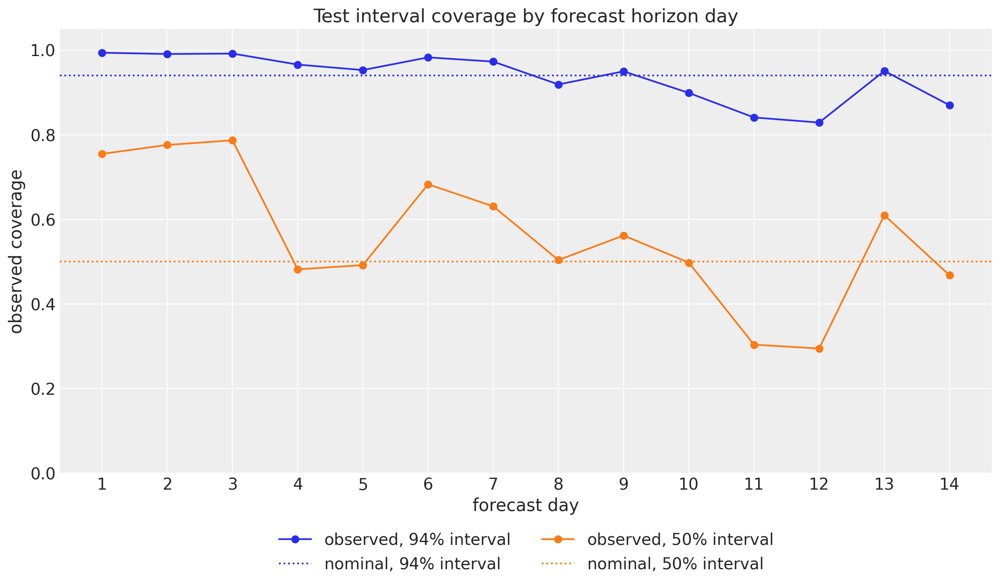

In [37]:
forecast_days = np.arange(1, horizon + 1)

fig, ax = plt.subplots()
for alpha, color, label in ((0.94, "C0", r"$94\%$ interval"), (0.5, "C1", r"$50\%$ interval")):
    coverage_by_day = np.array(
        [
            float(eval_coverage(pred_test[:, day, :], y_test_original[day], alpha=alpha))
            for day in range(horizon)
        ]
    )
    ax.plot(forecast_days, coverage_by_day, marker="o", color=color, label=f"observed, {label}")
    ax.axhline(alpha, color=color, linestyle=":", linewidth=1.5, label=f"nominal, {label}")
    print(f"observed coverage by day, {alpha:.0%} interval: {np.round(coverage_by_day, 3)}")
ax.legend(loc="upper center", bbox_to_anchor=(0.5, -0.1), ncol=2)
ax.set(
    xlabel="forecast day",
    ylabel="observed coverage",
    title="Test interval coverage by forecast horizon day",
    xticks=forecast_days,
    ylim=(0.0, 1.05),
);

### Interval diagnostics

Two sharper views of the same calibration question. The top panel tracks
the PIT, the fraction of forecast draws below the observed value (ties,
which the zero clipping makes common, count half), by horizon day: a
value of $0.5$ means the truth sits at the forecast median, and a
calibrated forecast keeps the interquartile band centered on $0.5$. The
bottom panel splits the $94\%$-interval misses by direction against the
nominal $3\%$ per side; this is where a trend miss shows up most
directly, since a level that cannot extrapolate drift produces an
above-side excess that grows with the horizon. All three curves are
printed under the figure as well, so the day-by-day numbers quoted below
can be read off directly instead of eyeballed.

median PIT by day:          [0.46 0.44 0.53 0.52 0.56 0.53 0.55 0.7  0.64 0.72 0.74 0.75 0.6  0.75]
above-side miss share:      [0.002 0.002 0.006 0.025 0.032 0.01  0.019 0.079 0.046 0.097 0.136 0.147
 0.047 0.125]
below-side miss share:      [0.004 0.007 0.002 0.009 0.015 0.007 0.008 0.002 0.004 0.004 0.023 0.024
 0.002 0.005]

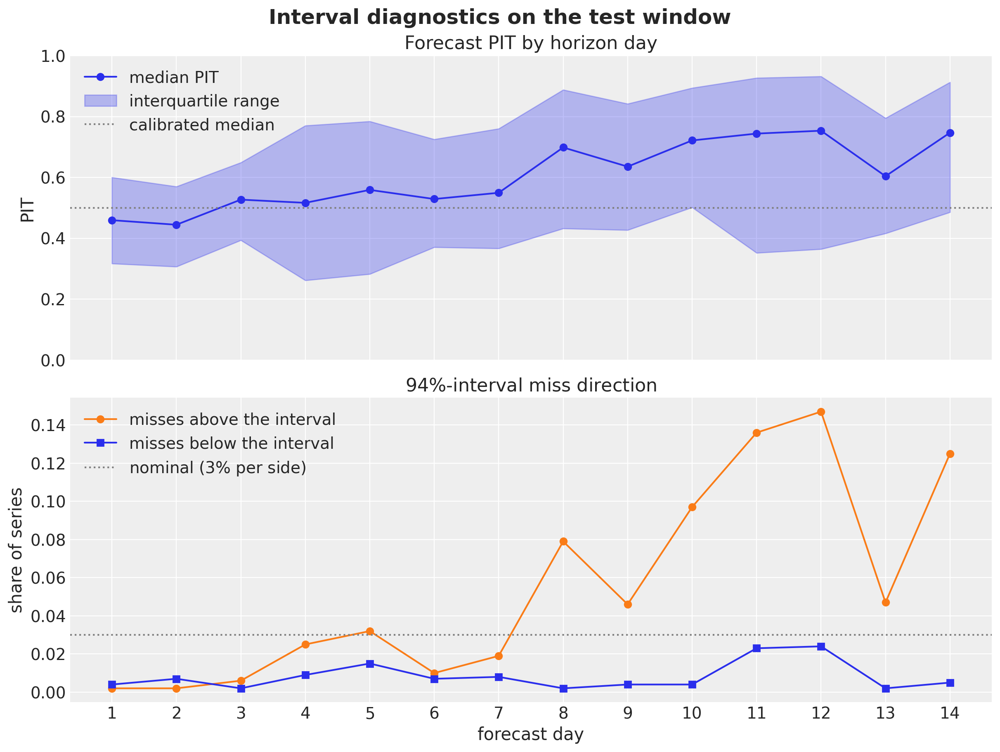

In [38]:
pit = (pred_test_da < y_test_da).mean("sample") + 0.5 * (pred_test_da == y_test_da).mean("sample")
above_share = (y_test_da > quantiles.sel(quantile=0.97)).mean("series")
below_share = (y_test_da < quantiles.sel(quantile=0.03)).mean("series")

fig, axes = plt.subplots(nrows=2, figsize=(12, 9), sharex=True, layout="constrained")
axes[0].plot(forecast_days, pit.median("series"), "o-", color="C0", label="median PIT")
axes[0].fill_between(
    forecast_days,
    pit.quantile(0.25, dim="series"),
    pit.quantile(0.75, dim="series"),
    color="C0",
    alpha=0.3,
    label="interquartile range",
)
axes[0].axhline(0.5, color="gray", linestyle=":", label="calibrated median")
axes[0].legend(loc="upper left")
axes[0].set(
    ylabel="PIT",
    title="Forecast PIT by horizon day",
    xticks=forecast_days,
    ylim=(0.0, 1.0),
)
axes[1].plot(forecast_days, above_share, "o-", color="C1", label="misses above the interval")
axes[1].plot(forecast_days, below_share, "s-", color="C0", label="misses below the interval")
axes[1].axhline(0.03, color="gray", linestyle=":", label=r"nominal ($3\%$ per side)")
axes[1].legend(loc="upper left")
axes[1].set(
    xlabel="forecast day",
    ylabel="share of series",
    title=r"$94\%$-interval miss direction",
    xticks=forecast_days,
)
fig.suptitle("Interval diagnostics on the test window", fontsize=18, fontweight="bold")
# The narrative below reads these three curves off the figure, so print them too.
print(f"median PIT by day:          {np.round(pit.median('series').to_numpy(), 2)}")
print(f"above-side miss share:      {np.round(above_share.to_numpy(), 3)}")
print(f"below-side miss share:      {np.round(below_share.to_numpy(), 3)}")

The two panels pin the story down. The median PIT starts just below
$0.5$ and drifts upward through the horizon, and the miss directions are
sharply asymmetric: below-side misses stay at or near the nominal $3\%$
on every day, while above-side misses first touch nominal around day $5$
and run well above it from day $8$ on, reaching the mid-teens in the
second week. That asymmetry says the $94\%$ under-coverage is a
*directional* miss, not a band that is uniformly too narrow: a merely
narrow interval would leak on both sides (mean-field variational
inference’s tendency toward too-narrow posteriors can contribute to the
level, but it cannot explain the one-sidedness). Without the damped
trend these curves are far worse (by day $14$ the median PIT sits far
above $0.5$ and the above-side misses run several times the nominal
rate); with it much of the drift is gone, but the late days still run
hot: the panel’s momentum in the test window is at the upper end of what
the damped slope extrapolates. The same drift explains the coverage
cancellation noted above: early days over-cover with the
heavy-tail-widened band, late days under-cover as the truth walks out
the top, and the $50\%$ aggregate ends up only a few points from nominal
by coincidence rather than by calibration, which is exactly why the
directional diagnostics are worth plotting next to the averages. A
post-hoc interval calibration would target that residual drift directly;
we leave it on the next-steps list rather than pursue it in this
notebook.

### Scaling belongs inside the fold

One methodological remark before leaving the evaluation. The per-series
scale was computed once, from the training window of our single split,
and that is sound because there is only one split. The moment this
evaluation graduates to rolling-origin backtesting, that global step
becomes a leak: each fold has a different training window, and a scale
computed outside the fold loop (worse, on the full series) feeds the
fold information about levels it has not seen yet, exactly the leakage
the scaling section warned about. The normalization is part of the model
pipeline, and in a backtest the pipeline must run once per fold.

The package’s `backtest` helper leaves room for exactly this: its
`forecast_fn` is any callable
`(rng_key, model, train_data, train_covariates, full_covariates, num_samples, *, batch_size=None)`
returning forecast draws, and it slices the *raw* data per window before
calling it. Everything between the raw window and the returned draws
belongs to the closure, so the clean way to fold the scaling in is to
derive the scale inside it, from whatever training window the fold hands
over, fit on the scaled data, and rescale the draws on the way out. We
define it here but do not run it (the single split above is already
scored); the next steps point to it for the backtesting extension.

In [39]:
def scaled_forecast_fn(
    rng_key: Array,
    model: ForecastModel,
    train_data: Float[Array, " t_train n_series"],
    train_covariates: Float[Array, " n_inputs t_train n_series"],
    full_covariates: Float[Array, " n_inputs duration n_series"],
    num_samples: int,
    *,
    batch_size: int | None = None,
) -> Array | np.ndarray:
    """SVI forecast closure that owns the per-series mean scaling as a fit-time step.

    Computes the per-series scale from the training window it is handed, fits
    the model on the scaled data, and returns forecast draws rescaled to the
    original units (clipped at zero, since sales are non-negative). Because the
    scale is derived from ``train_data`` alone, inside the call,
    ``backtest(..., forecast_fn=scaled_forecast_fn)`` recomputes the
    normalization inside every fold, so no future level can leak into the model
    input.

    Parameters
    ----------
    rng_key
        PRNG key for the fit, the posterior draw, and the forecast.
    model
        The forecasting model to fit, as returned by ``model_fn``.
    train_data
        Raw (unscaled) training data with time at axis ``-2``.
    train_covariates
        Covariates over the training window, time at axis ``-2``.
    full_covariates
        Covariates over the training window followed by the test horizon.
    num_samples
        Number of forecast draws to return.
    batch_size
        Chunk size forwarded to ``draw_posterior`` and ``forecast``.

    Returns
    -------
    Array | np.ndarray
        Forecast draws on the original sales scale, shape
        ``(num_samples, horizon, n_series)``.
    """
    key_fit, key_post, key_fc = random.split(rng_key, 3)
    fold_scale: Float[Array, " n_series"] = train_data.mean(axis=-2)
    scaled_data = train_data / fold_scale
    fold_guide = AutoNormal(model)
    fold_svi = SVI(model, fold_guide, optax_to_numpyro(optimizer), Trace_ELBO())
    result = fold_svi.run(key_fit, num_steps, train_covariates, scaled_data, progress_bar=False)
    fold_posterior = draw_posterior(
        key_post, fold_guide, result.params, num_samples, batch_size=batch_size
    )
    pred = forecast(
        key_fc, model, fold_posterior, scaled_data, full_covariates, batch_size=batch_size
    )
    return jnp.clip(pred * fold_scale, min=0.0)

## Forecast visualization

The in-sample posterior predictive (blue) and the $14$-day forecast
(orange) for the same series we explored before modeling (the ten
largest by volume and the ten with the most zero-availability days),
with the $50\%$ and $94\%$ HDI bands, the observed sales in black, and
the availability input in red on a secondary axis. Note how the bands
collapse toward zero whenever availability drops, including in the
forecast window: the factor propagates the known future availability
into the predictive distribution. The next section removes exactly that
ingredient to forecast demand instead of sales, and reuses the same
panel layout, so the plotting code lives in a small helper that takes
the test-window ensemble (and the forecast bands’ color and legend
label) as arguments.

/Users/juanitorduz/Documents/numpyro_forecast/.venv/lib/python3.14/site-packages/arviz_plots/plots/lm_plot.py:360: UserWarning: When multiple credible intervals are plotted, it is recommended to map 'alpha' aesthetic to 'prob' dimension to differentiate between intervals.
  warnings.warn(

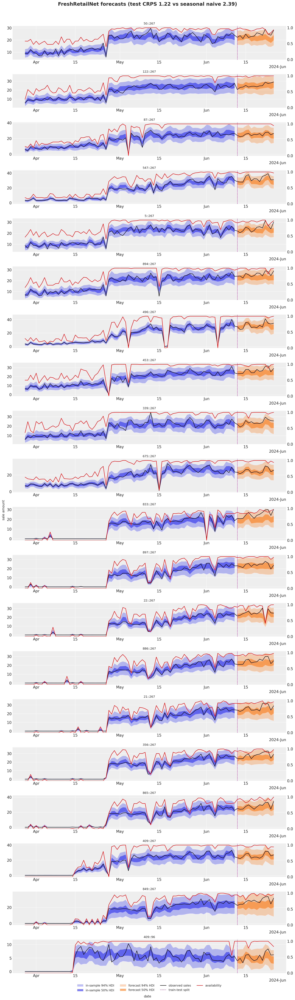

In [40]:
def plot_forecast_panel(
    pred_test_draws: xr.DataArray,
    availability: xr.DataArray,
    forecast_color: str,
    forecast_label: str,
    suptitle: str,
) -> None:
    """Facet the in-sample predictive and a test-window ensemble for the EDA series.

    Draws the in-sample posterior predictive bands (blue), the test-window
    forecast bands, the observed sales, the train-test split, and the
    availability on a twin axis, one row per series in ``plot_labels``. The
    in-sample ensemble is the same for both callers, so the helper reads
    ``pred_train_da`` (and the panel scaffolding) from the enclosing scope and
    parametrizes only what changes between the two figures.

    Parameters
    ----------
    pred_test_draws
        Test-window predictive draws on the original sales scale, dims
        ``(sample, time, series)``.
    availability
        Availability drawn on the twin axis, dims ``(time, series)`` over the
        full window. Pass the availability input the test-window predictions
        actually consumed, so the figure represents the features behind the
        forecast.
    forecast_color
        Matplotlib color for the test-window HDI bands.
    forecast_label
        Legend prefix for the test-window bands.
    suptitle
        Figure title.
    """
    pc = az.plot_lm(
        predictions_to_datatree(
            pred_train_da.sel(series=plot_labels).to_numpy(), dates_num[:t_train], plot_labels
        ),
        y="obs",
        x="t",
        plot_dim="time",
        ci_kind="hdi",
        ci_prob=hdi_probs,
        smooth=False,
        col_wrap=1,
        visuals={
            "ci_band": {"color": "C0"},
            "observed_scatter": False,
            "pe_line": False,
            "xlabel": False,
            "ylabel": False,
        },
        aes={"alpha": ["prob"]},
        alpha=hdi_alphas,
        figure_kwargs={"figsize": (15, 2.5 * len(plot_labels))},
    )
    train_bands = pc.viz["ci_band"]["t"].sel(series=plot_labels[-1])
    az.plot_lm(
        predictions_to_datatree(
            pred_test_draws.sel(series=plot_labels).to_numpy(), dates_num[t_train:], plot_labels
        ),
        y="obs",
        x="t",
        plot_dim="time",
        plot_collection=pc,
        ci_kind="hdi",
        ci_prob=hdi_probs,
        smooth=False,
        visuals={
            "ci_band": {"color": forecast_color},
            "observed_scatter": False,
            "pe_line": False,
            "xlabel": False,
            "ylabel": False,
        },
    )

    truth_da = (
        panel_ds["sale_amount"].sel(series=plot_labels).assign_coords(time=dates_num).rename("t")
    )
    x_da = xr.DataArray(dates_num, dims=["time"], coords={"time": dates_num})
    pc.map(
        az.visuals.line_xy,
        "truth",
        data=truth_da,
        x=x_da,
        ignore_aes=pc.aes_set,
        color="black",
        lw=1.5,
    )

    for label in plot_labels:
        ax = pc.get_target("t", {"series": label})
        ax.set_title(label, fontsize=11)
        split_line = ax.axvline(split_x, color="C3", linestyle="--", linewidth=1)
        ax_twin = ax.twinx()
        (availability_line,) = ax_twin.plot(
            dates_num, availability.sel(series=label), color="red", linewidth=1.5
        )
        ax_twin.grid(False)
        ax_twin.set(ylim=(0, 1.05))
        locator = mdates.AutoDateLocator()
        ax.xaxis.set_major_locator(locator)
        ax.xaxis.set_major_formatter(mdates.ConciseDateFormatter(locator))

    test_bands = pc.viz["ci_band"]["t"].sel(series=plot_labels[-1])
    band_handles = []
    for bands, prefix in ((train_bands, "in-sample "), (test_bands, f"{forecast_label} ")):
        for prob in (0.94, 0.5):
            band = bands.sel(prob=prob).item()
            band.set_label(hdi_label(prob, prefix=prefix))
            band_handles.append(band)
    truth_line = pc.viz["truth"]["t"].sel(series=plot_labels[-1]).item()
    truth_line.set_label("observed sales")
    split_line.set_label("train-test split")
    availability_line.set_label("availability")

    fig = pc.viz["figure"].item()
    ax_last = pc.get_target("t", {"series": plot_labels[-1]})
    ax_last.legend(
        handles=[*band_handles, truth_line, split_line, availability_line],
        loc="upper center",
        bbox_to_anchor=(0.5, -0.25),
        ncols=4,
        fontsize=11,
    )
    fig.supxlabel("date")
    fig.supylabel("sale amount")
    fig.suptitle(suptitle, fontsize=18, fontweight="bold", y=1.02)


plot_forecast_panel(
    pred_test_da,
    panel_ds["availability"],
    forecast_color="C1",
    forecast_label="forecast",
    suptitle=(
        f"FreshRetailNet forecasts (test CRPS {crps_test_model:.2f} "
        f"vs seasonal naive {crps_test_naive:.2f})"
    ),
)

## From sales to demand: forecasting at full availability

The forecast above answers the question the *evaluation* needed: what
will sales be, given the availability the test window actually recorded.
That is the right conditioning for retrospective scoring, but it is not
a forecast a business can act on, for two reasons. First, nobody knows
future availability at prediction time; the retrospective setup borrows
it from the recorded data. Second, and more fundamentally, a planner who
orders against a stockout-censored sales forecast bakes yesterday’s
stockouts into tomorrow’s order quantities: the model predicts low sales
where availability dipped, the buyer orders little, and the stockout
repeats itself. What replenishment needs is the quantity the
factorization was built to expose: the *demand*, what would sell with
the product fully on the shelf.

Because expected sales factor into demand times availability, that
counterfactual is one covariate edit away: pin the availability input to
one over the forecast horizon and rerun the same `forecast` call with
the same posterior draws; the trend, seasonality, promotion, and launch
inputs stay untouched. The factor’s normalization makes the reading
exact: $f_{t,s} = 1$ at $a_{t,s} = 1$, so the demand forecast coincides
with the sales forecast on the days the shelf was in fact fully stocked,
and rises above it exactly where availability dipped. We also reuse the
*same* PRNG key as the sales forecast, so the two ensembles share their
predictive noise draws (common random numbers) and their difference is
purely the availability correction, not Monte Carlo noise.

One thing this forecast deliberately is *not*: a prediction of the
observed test sales. Observed sales are censored by the very stockouts
we are removing, so on stockout days the demand forecast *should* sit
above the black line, and scoring it against observed sales (as the CRPS
table did for the sales forecast) would penalize it for being right. The
printouts quantify how much demand the sales forecast leaves on the
table over the test window.

In [41]:
covariates_demand_da: xr.DataArray = covariates_da.copy(deep=True)
covariates_demand_da.loc[{"input": "availability", "time": slice(dates[t_train], None)}] = 1.0
covariates_demand: Float[
    Array, " availability_discount_activity_holiday_ramp duration n_series"
] = jnp.asarray(
    covariates_demand_da.transpose("input", "time", "series").to_numpy(), dtype=jnp.float32
)

# np.asarray for the same reason as the scoring cell above: keep the rescale and
# the clip in NumPy on the host, sharing the buffer instead of copying it.
fc_demand_scaled = np.asarray(
    forecast(
        key_score_fc,
        model,
        posterior_draws,
        y_train,
        covariates_demand,
        batch_size=250,
        device="host",
    )
)
pred_test_demand = np.clip(fc_demand_scaled * scale_np[None, None, :], 0.0, None)
pred_test_demand_da = draws_to_da(pred_test_demand, dates[t_train:])

demand_total = pred_test_demand_da.mean("sample").sum("time")
sales_total = pred_test_da.mean("sample").sum("time")
series_uplift = demand_total / sales_total - 1
panel_uplift = float(demand_total.sum() / sales_total.sum() - 1)
print(f"expected demand above the sales forecast on the test window: {panel_uplift:+.1%}")
print(f"series with an uplift above 1%: {float((series_uplift > 0.01).mean()):.1%} of the panel")
print(
    f"largest per-series uplift: {float(series_uplift.max()):+.1%} "
    f"(series {series_uplift.idxmax().item()})"
)

expected demand above the sales forecast on the test window: +8.6%
series with an uplift above 1%: 81.7% of the panel
largest per-series uplift: +168.4% (series 438::300)

The correction is meaningful in aggregate, about $8.6\%$ of the forecast
test-window volume, and its anatomy follows the saturating factor: near
full availability the factor is almost flat, so a day that loses a few
sales-weighted hours contributes nothing visible, while a day that drops
to low availability contributes a lot. Deep dips are scattered widely
across the panel’s two forecast weeks, so the uplift is broad ($82\%$ of
the series gain more than $1\%$) but very uneven, running past $+150\%$
for the most stockout-prone series. The faceted view below shows this
series by series, in the same layout as the forecast plot above but with
the demand bands in green. One detail changes deliberately: the red
availability line now shows the *input these predictions actually
consumed*, the observed availability in-sample and a constant one over
the forecast window, because a plot of a forecast should represent the
features that produced it. To see where availability actually dipped in
the test window, compare with the sales-forecast panel above; the
single-series comparison further below makes that contrast explicit.

/Users/juanitorduz/Documents/numpyro_forecast/.venv/lib/python3.14/site-packages/arviz_plots/plots/lm_plot.py:360: UserWarning: When multiple credible intervals are plotted, it is recommended to map 'alpha' aesthetic to 'prob' dimension to differentiate between intervals.
  warnings.warn(

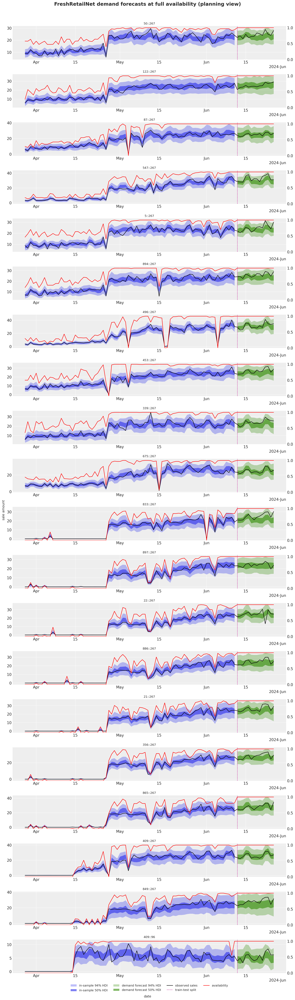

In [42]:
plot_forecast_panel(
    pred_test_demand_da,
    covariates_demand_da.sel(input="availability"),
    forecast_color="C2",
    forecast_label="demand forecast",
    suptitle="FreshRetailNet demand forecasts at full availability (planning view)",
)

On fully stocked days the green bands reproduce the orange ones exactly
(shared noise draws, factor pinned at one), so nothing is lost by
planning on the demand forecast. Where availability dropped in the test
window the demand bands detach upward from the observed sales, and that
gap is the model’s estimate of the unmet demand behind the stockout.

### Zooming in: the two forecasts on a decaying-availability series

The panel view compresses fourteen days into a thin strip, so let us
zoom into the series where the counterfactual matters most in this test
window: `22::267`, whose recorded availability drops sharply late in the
forecast window, down to $0.42$ on the worst day. The two rows below
show the test window only, on a shared sales axis: the top row is the
sales forecast conditioned on the observed availability, the bottom row
the demand forecast at availability one, and the red line in each row is
the availability input that row’s forecast consumed.

22::267 | expected test-window sales 313 units | expected demand 336 units (+7.2%)
largest daily gap on 2024-06-22 (availability 0.42): expected sales 14.1 vs demand 26.5

/Users/juanitorduz/Documents/numpyro_forecast/.venv/lib/python3.14/site-packages/arviz_plots/plots/lm_plot.py:360: UserWarning: When multiple credible intervals are plotted, it is recommended to map 'alpha' aesthetic to 'prob' dimension to differentiate between intervals.
  warnings.warn(

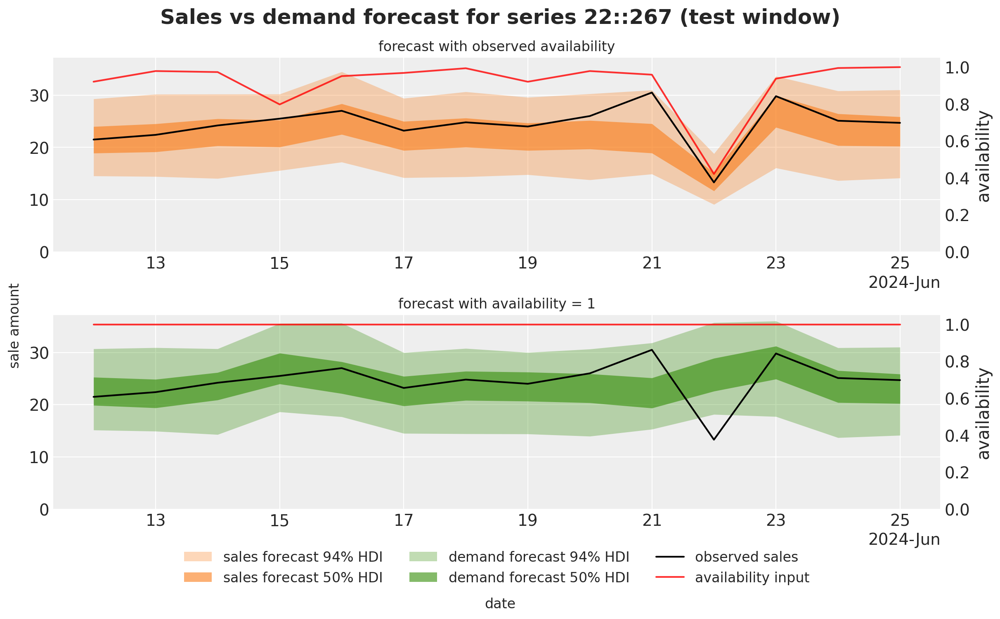

In [43]:
comparison_id = "22::267"
comparison_labels = ["forecast with observed availability", "forecast with availability = 1"]
comparison_dim = xr.DataArray(comparison_labels, dims=["series"], name="series")
comparison_da = xr.concat(
    [
        pred_test_da.sel(series=comparison_id, drop=True),
        pred_test_demand_da.sel(series=comparison_id, drop=True),
    ],
    dim=comparison_dim,
)
availability_test_comp = (
    panel_ds["availability"].isel(time=slice(t_train, None)).sel(series=comparison_id, drop=True)
)
comparison_availability = xr.concat(
    [availability_test_comp, xr.ones_like(availability_test_comp)],
    dim=comparison_dim,
)

sales_mean_comp = pred_test_da.sel(series=comparison_id).mean("sample")
demand_mean_comp = pred_test_demand_da.sel(series=comparison_id).mean("sample")
uplift_comp = float(demand_mean_comp.sum() / sales_mean_comp.sum() - 1)
worst_day = (demand_mean_comp - sales_mean_comp).idxmax("time")
print(
    f"{comparison_id} | expected test-window sales {float(sales_mean_comp.sum()):.0f} units | "
    f"expected demand {float(demand_mean_comp.sum()):.0f} units ({uplift_comp:+.1%})"
)
print(
    f"largest daily gap on {worst_day.to_numpy().astype('datetime64[D]')} "
    f"(availability "
    f"{float(panel_ds['availability'].sel(series=comparison_id, time=worst_day)):.2f}): "
    f"expected sales {float(sales_mean_comp.sel(time=worst_day)):.1f} "
    f"vs demand {float(demand_mean_comp.sel(time=worst_day)):.1f}"
)

pc = az.plot_lm(
    predictions_to_datatree(
        comparison_da.transpose("sample", "time", "series").to_numpy(),
        dates_num[t_train:],
        comparison_labels,
    ),
    y="obs",
    x="t",
    plot_dim="time",
    ci_kind="hdi",
    ci_prob=hdi_probs,
    smooth=False,
    col_wrap=1,
    visuals={
        "ci_band": {"color": "C1"},
        "observed_scatter": False,
        "pe_line": False,
        "xlabel": False,
        "ylabel": False,
    },
    aes={"alpha": ["prob"]},
    alpha=hdi_alphas,
    figure_kwargs={"figsize": (12, 7)},
)
for prob in (0.94, 0.5):
    pc.viz["ci_band"]["t"].sel(series=comparison_labels[-1], prob=prob).item().set_color("C2")

truth_da = (
    y_test_da.sel(series=comparison_id, drop=True)
    .expand_dims(series=comparison_labels)
    .transpose("time", "series")
    .assign_coords(time=dates_num[t_train:])
    .rename("t")
)
x_da = xr.DataArray(dates_num[t_train:], dims=["time"], coords={"time": dates_num[t_train:]})
pc.map(
    az.visuals.line_xy,
    "truth",
    data=truth_da,
    x=x_da,
    ignore_aes=pc.aes_set,
    color="black",
    lw=1.5,
)

comparison_axes = [pc.get_target("t", {"series": label}) for label in comparison_labels]
shared_top = max(ax.get_ylim()[1] for ax in comparison_axes)
for ax, label in zip(comparison_axes, comparison_labels, strict=True):
    ax.set_title(label, fontsize=12)
    ax.set_ylim(0.0, shared_top)
    ax_twin = ax.twinx()
    (availability_line,) = ax_twin.plot(
        dates_num[t_train:],
        comparison_availability.sel(series=label),
        color="red",
        alpha=0.8,
        linewidth=1.5,
    )
    ax_twin.grid(False)
    ax_twin.set(ylim=(0, 1.05), ylabel="availability")
    locator = mdates.AutoDateLocator()
    ax.xaxis.set_major_locator(locator)
    ax.xaxis.set_major_formatter(mdates.ConciseDateFormatter(locator))

legend_handles = []
for label, prefix in zip(comparison_labels, ("sales forecast ", "demand forecast "), strict=True):
    for prob in (0.94, 0.5):
        band = pc.viz["ci_band"]["t"].sel(series=label, prob=prob).item()
        band.set_label(hdi_label(prob, prefix=prefix))
        legend_handles.append(band)
truth_line = pc.viz["truth"]["t"].sel(series=comparison_labels[-1]).item()
truth_line.set_label("observed sales")
availability_line.set_label("availability input")
legend_handles += [truth_line, availability_line]
comparison_axes[-1].legend(
    handles=legend_handles,
    loc="upper center",
    bbox_to_anchor=(0.5, -0.15),
    ncols=3,
    fontsize=12,
)
fig = pc.viz["figure"].item()
fig.supxlabel("date")
fig.supylabel("sale amount")
fig.suptitle(
    f"Sales vs demand forecast for series {comparison_id} (test window)",
    fontsize=18,
    fontweight="bold",
    y=1.05,
);

The comparison makes the counterfactual concrete, and the printout puts
numbers on it. In the top row the orange bands are pulled down exactly
where the availability input dips, most sharply on $2024$-$06$-$22$: the
model expects the stockout to censor sales, and that censored view is
precisely what makes the forecast scoreable against the observed black
line. In the bottom row the green bands hold the underlying demand level
through those same days, because the input that produced them says the
shelf never empties; elsewhere the two rows nearly coincide, since
availability sits close to one. On the worst day the expected demand
($26.5$ units) is nearly twice the expected sale ($14.1$ units), and
over the full window the demand forecast carries $7.2\%$ more volume for
this series. That gap is the demand a planner would silently forfeit by
ordering to the censored forecast, and the stockout would then repeat
itself by construction. This demand fan, not the sales forecast, is the
input a replenishment decision should consume; the sales forecast’s job
was to be scoreable against what was actually observed.

## Inspecting the availability factor

The factor parameters are per series, so we can ask what the model
actually learned about stockouts. First the floor $\phi_s$ and the
saturation rate $b_s$ across the panel:

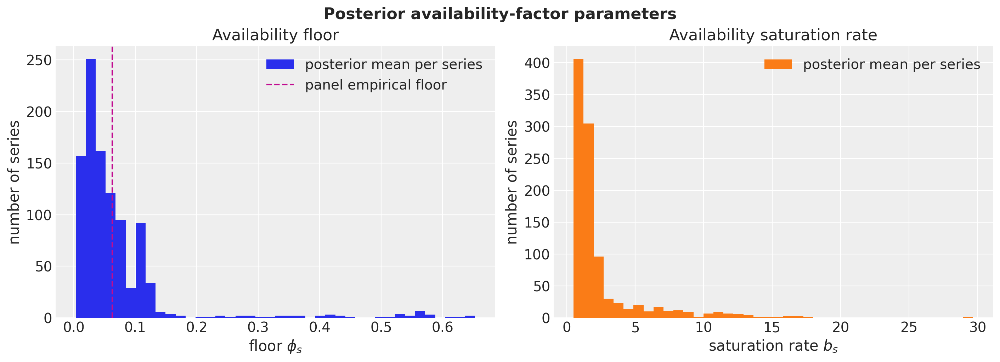

In [44]:
floor_mean = tree["posterior"]["floor"].mean(dim=("chain", "draw"))
b_avail_mean = tree["posterior"]["b_avail"].mean(dim=("chain", "draw"))

train_availability = panel_ds["availability"].isel(time=slice(None, t_train))
train_scaled_sales = y_scaled.isel(time=slice(None, t_train))
panel_floor = float(train_scaled_sales.where(train_availability == 0.0).mean())

fig, axes = plt.subplots(ncols=2, figsize=(14, 5), layout="constrained")
axes[0].hist(floor_mean.to_numpy(), bins=40, color="C0", label="posterior mean per series")
axes[0].axvline(panel_floor, color="C3", linestyle="--", label="panel empirical floor")
axes[0].legend(loc="upper right")
axes[0].set(xlabel=r"floor $\phi_s$", ylabel="number of series", title="Availability floor")
axes[1].hist(b_avail_mean.to_numpy(), bins=40, color="C1", label="posterior mean per series")
axes[1].legend(loc="upper right")
axes[1].set(
    xlabel=r"saturation rate $b_s$",
    ylabel="number of series",
    title="Availability saturation rate",
)
fig.suptitle("Posterior availability-factor parameters", fontsize=16, fontweight="bold");

And the implied factor curve, averaged over series, against the panel’s
own empirical curve, with the per-series posterior-mean curves of the
six focus series in gray for scale. To compare the two shapes on equal
footing, the binned means are rescaled so that the top availability bin
equals one: the factor is anchored at $f(1) = 1$, while raw scaled sales
on fully available days average above one on this launch-driven panel
(post-launch days have both high availability and a high level).

/Users/juanitorduz/Documents/numpyro_forecast/.venv/lib/python3.14/site-packages/arviz_plots/plots/lm_plot.py:360: UserWarning: When multiple credible intervals are plotted, it is recommended to map 'alpha' aesthetic to 'prob' dimension to differentiate between intervals.
  warnings.warn(

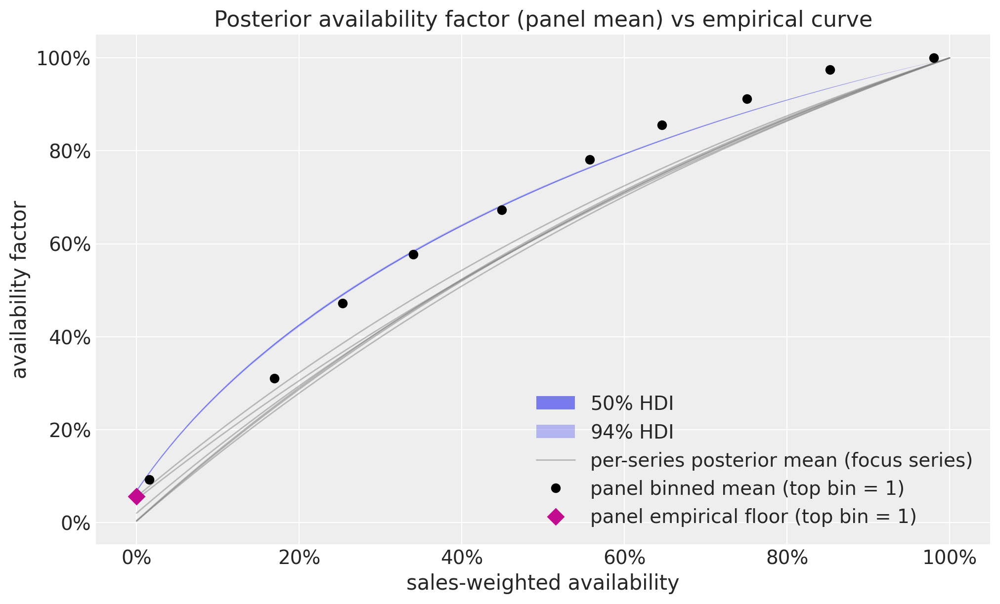

In [45]:
posterior_factor = (
    tree["posterior"]
    .dataset[["floor", "b_avail"]]
    .stack(sample=("chain", "draw"))
    .isel(sample=slice(None, 250))
)
a_grid_da = xr.DataArray(availability_grid, dims=["a_grid"])
factor_draws = xr.apply_ufunc(
    availability_factor, a_grid_da, posterior_factor["b_avail"], posterior_factor["floor"]
)
factor_panel_curves = factor_draws.mean("series")

availability_bin_da = (
    (train_availability * 10).astype(np.int64).clip(0, 9).rename("availability_bin")
)
panel_bin_availability = train_availability.groupby(availability_bin_da).mean()
panel_bin_sales = train_scaled_sales.groupby(availability_bin_da).mean()
top_bin_sales = float(panel_bin_sales.isel(availability_bin=-1))

pc = az.plot_lm(
    predictions_to_datatree(
        factor_panel_curves.transpose("sample", "a_grid").to_numpy()[:, :, None],
        availability_grid,
        ["posterior factor"],
    ),
    y="obs",
    x="t",
    plot_dim="time",
    ci_kind="hdi",
    ci_prob=hdi_probs,
    smooth=False,
    visuals={
        "ci_band": {"color": "C0"},
        "observed_scatter": False,
        "pe_line": False,
        "xlabel": False,
        "ylabel": False,
    },
    aes={"alpha": ["prob"]},
    alpha=hdi_alphas,
    figure_kwargs={"figsize": (10, 6)},
)
ax = pc.get_target("t", {"series": "posterior factor"})
factor_series_means = factor_draws.mean("sample")
for i, label in enumerate(focus_labels):
    ax.plot(
        availability_grid,
        factor_series_means.sel(series=label),
        color="gray",
        alpha=0.5,
        linewidth=1,
        label="per-series posterior mean (focus series)" if i == 0 else None,
    )
ax.plot(
    panel_bin_availability,
    panel_bin_sales / top_bin_sales,
    "o",
    color="black",
    label="panel binned mean (top bin = 1)",
)
ax.plot(
    0.0,
    panel_floor / top_bin_sales,
    "D",
    color="C3",
    markersize=8,
    label="panel empirical floor (top bin = 1)",
)
bands = pc.viz["ci_band"]["t"].sel(series="posterior factor")
for prob in (0.94, 0.5):
    bands.sel(prob=prob).item().set_label(hdi_label(prob))
ax.legend(loc="lower right")
ax.xaxis.set_major_formatter(mtick.PercentFormatter(xmax=1, decimals=0))
ax.yaxis.set_major_formatter(mtick.PercentFormatter(xmax=1, decimals=0))
ax.set(
    xlabel="sales-weighted availability",
    ylabel="availability factor",
    title="Posterior availability factor (panel mean) vs empirical curve",
);

The posterior factor reproduces the saturating shape and the positive
floor. The $50\%$ and $94\%$ HDI bands are so thin they read as a single
line, and that is not a plotting artifact but a consequence of what is
being plotted: the bands quantify the posterior uncertainty of the
*panel-mean* curve, the average of a thousand per-series factor curves.
The genuine heterogeneity across series (visible in the gray per-series
posterior means, whose floors and curvatures differ substantially) is
averaged away by construction, and what remains is the uncertainty about
the average itself, which shrinks roughly like
$1/\sqrt{n_{\text{series}}}$ on top of per-series parameters that $76$
days of data already pin down well. A per-series version of this plot
would show much wider bands; the panel mean is deliberately the sharpest
view. The curve sits below the rescaled empirical points over most of
the range, and that gap is the endogeneity correction at work:
high-demand days both sell more and sell out more often, so part of the
raw curve’s height belongs to the trend, seasonality, and promotions,
and the model attributes it there instead of to availability itself.

## Inspecting the store hierarchy

The covariate effects are pooled by store. Plotting each series’
discount effect against its store-level location shows the partial
pooling: series means line up along the identity line, shrunk toward
their store’s location, more strongly where the store scale
$\sigma^{\text{store}}$ is small. Read the tightness with the store-size
caveat from the panel build in mind: with a median of one series per
store, many points sit near the line simply because the store location
is informed by that single series, and the genuine cross-series pooling
acts in the multi-series stores, where the vertical spread around the
line is the shrinkage at work. The plot also shows why the cleaned
discount encoding and the launch indicator matter: without them, a
cluster of series escapes to coefficients an order of magnitude above
their store locations (the spurious launch-step optimum described in the
evaluation section); with them, the scatter hugs the identity line.

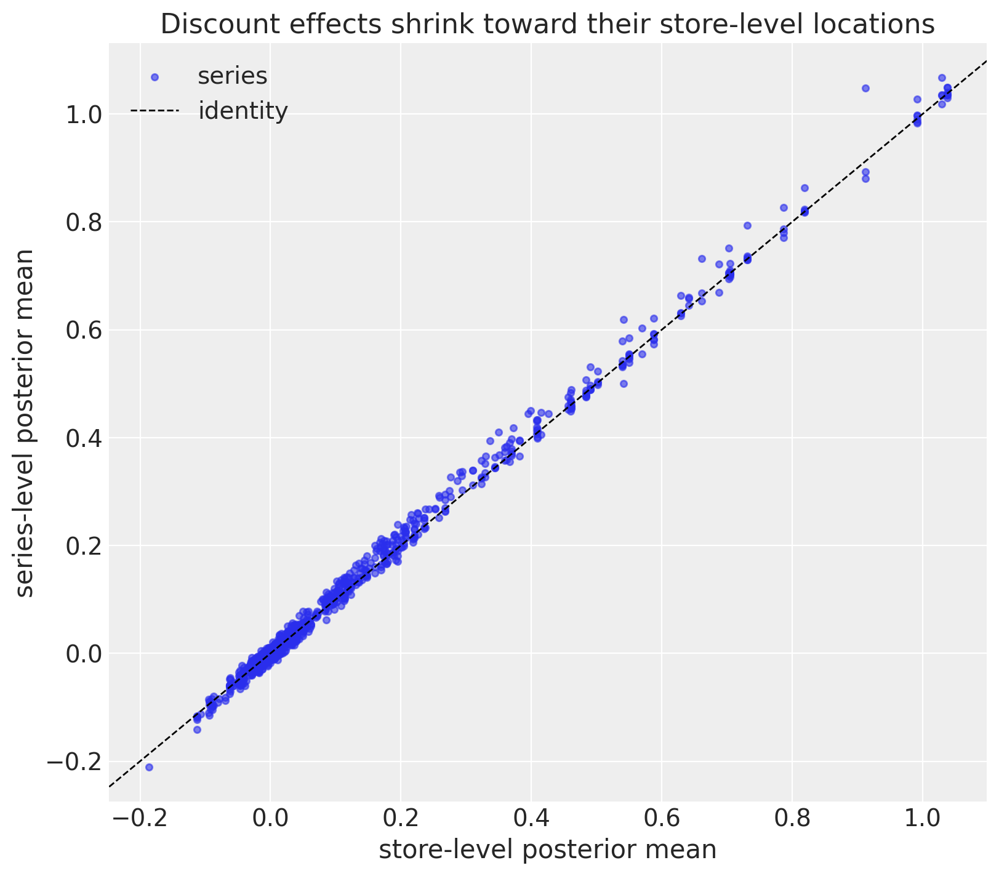

In [46]:
b_series_mean = cast(
    "xr.DataArray",
    tree["posterior"]["b"].sel(covariate="discount_magnitude").mean(dim=("chain", "draw")),
)
b_store_loc_mean = cast(
    "xr.DataArray",
    tree["posterior"]["b_loc_store"]
    .sel(covariate="discount_magnitude")
    .mean(dim=("chain", "draw")),
)
# A vectorized label-based gather: for each series, look up its store's location
# on the posterior's store dimension via the series -> store id lookup table.
b_store_loc_per_series = b_store_loc_mean.sel(store=series_store_da)

fig, ax = plt.subplots(figsize=(8, 7))
ax.scatter(
    b_store_loc_per_series.to_numpy(),
    b_series_mean.to_numpy(),
    color="C0",
    alpha=0.6,
    s=14,
    label="series",
)
ax.axline((0.0, 0.0), slope=1.0, color="black", linestyle="--", linewidth=1, label="identity")
ax.legend(loc="upper left")
ax.set(
    xlabel="store-level posterior mean",
    ylabel="series-level posterior mean",
    title="Discount effects shrink toward their store-level locations",
);

## Promotion contributions

The reason to keep every promotion feature in the model is to read off
what each one contributes to sales. On the scaled axis a contribution of
$0.1$ means “one tenth of an average day’s sales”, so the units are
directly comparable across series. For each series we take the
posterior-mean coefficient times the feature’s average value on its
*active* days (days where the feature is positive) over the training
window, and summarize that quantity across the panel with a forest plot:
per feature, the open circle marks the cross-series median, the thick
segment the $50\%$ HDI, and the thin line the $94\%$ HDI of the
contribution across series. The plot stays entirely in named-tensor
land: `az.plot_forest` consumes the `(covariate, series)` contributions
array directly, treating the series axis as the sample dimension, and
the `skipna` entries in its `stats` mapping drop the series where a
feature has no active training day (whose active-day mean is NaN)
instead of blanking that feature’s row.

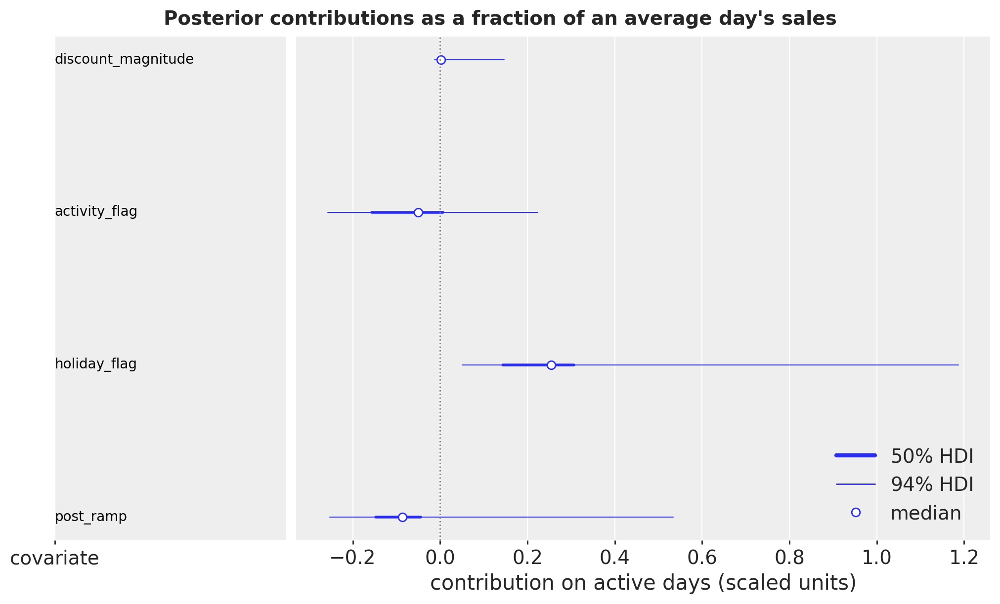

In [47]:
b_post_mean = cast("xr.DataArray", tree["posterior"]["b"].mean(dim=("chain", "draw")))
features_train = cast(
    "xr.DataArray",
    tree["constant_data"]["covariates"]
    .sel(input=covariate_names)
    .isel(time=slice(None, t_train))
    .rename(input="covariate"),
)
active_mean_x = features_train.where(features_train > 0).mean("time")
contributions = b_post_mean * active_mean_x

pc = az.plot_forest(
    contributions.to_dataset(name="contribution"),  # ty: ignore[invalid-argument-type]
    sample_dims=["series"],
    ci_kind="hdi",
    ci_probs=hdi_probs,
    point_estimate="median",
    labels=["covariate"],
    stats={
        "trunk": {"skipna": True},
        "twig": {"skipna": True},
        "point_estimate": {"skipna": True},
    },
    figure_kwargs={"figsize": (10, 6)},
)
ax = pc.viz["plot"].sel(column="forest").item()
ax.axvline(0.0, color="gray", linestyle=":", linewidth=1)
ax.legend(
    handles=[
        mlines.Line2D([], [], color="C0", linewidth=3, label=hdi_label(0.5)),
        mlines.Line2D([], [], color="C0", linewidth=1, label=hdi_label(0.94)),
        mlines.Line2D(
            [], [], color="C0", marker="o", markerfacecolor="white", linewidth=0, label="median"
        ),
    ],
    loc="lower right",
)
ax.set(xlabel="contribution on active days (scaled units)")
fig = pc.viz["figure"].item()
fig.suptitle(
    "Posterior contributions as a fraction of an average day's sales",
    fontsize=14,
    fontweight="bold",
);

The holiday effect is the one large, consistent promotion signal: about
a quarter of an average day’s sales on holiday days, in line with the
EDA lift. The cleaned discount effect is small and mostly non-negative
(its active days are the genuinely priced promotions, which for this
panel are sparse), and the activity effect is wide and centered near
zero, informative only for the minority of series that actually run
campaigns. The launch indicator deserves a careful read: its posterior
contribution ends up small and slightly negative, because in-sample the
random-walk level absorbs most of the launch step (under these priors a
few large drift innovations are the cheaper explanation), leaving the
indicator as a modest correction for series whose ramp missed the shared
date. Its value is preventive rather than predictive: it takes the
launch-shaped signal off the table for the *promotion* features, which
is exactly the spurious optimum described in the evaluation section.
Store-level pooling keeps the weakly informed series (the flagship
product whose cleaned discount feature is almost always zero, for
example) tied to their store’s typical effect instead of letting them
drift on noise.

## Next steps

- Calibrate the forecast intervals post hoc: estimate quantile-specific
  scaling on a held-out calibration window before the test period (a
  conformal-style correction), lifting the late-horizon upper tail
  flagged by the interval diagnostics and reining in the early-day
  over-coverage.
- Model the launch mechanism explicitly (an assortment-event effect
  shared across series within a store) instead of a fixed panel-wide
  indicator.
- Replace the mean-level factor with a censored likelihood: treat sales
  as latent demand right-censored by the available stock, which uses the
  same availability feature but models the mechanism instead of its
  average effect.
- Move to a strictly positive observation model (for example a negative
  binomial on rounded units), so the zero-sales days need no clipping
  and the heavier tail addresses the in-sample central-band
  over-coverage measured above.
- Add the weather covariates (precipitation, temperature) that this
  notebook left out.
- Evaluate with rolling-origin backtesting via the package’s `backtest`
  helper instead of a single split, passing the `scaled_forecast_fn`
  defined above as `forecast_fn` so the per-series scaling is recomputed
  inside every fold.

## References

- Yang, T., et al. (2025). [*FreshRetailNet-50K: A Stockout-Annotated
  Censored Demand Dataset for Latent Demand Recovery and Forecasting in
  Fresh Retail*](https://arxiv.org/abs/2505.16319). Dataset on [Hugging
  Face](https://huggingface.co/datasets/Dingdong-Inc/FreshRetailNet-50K).
- Orduz, J. [*Hierarchical forecasting with NumPyro (part
  I)*](https://juanitorduz.github.io/numpyro_hierarchical_forecasting_1/).
- Pyro. [*Forecasting III: Hierarchical
  Models*](https://pyro.ai/examples/forecasting_iii.html).
- Related examples: [hierarchical forecasting
  I](hierarchical_forecasting_1.html), [inference methods
  comparison](inference_methods_comparison.html).